# Preprocessing

In this notebook we document a few preprocessing steps which are not covered by the main preprocessing notebooks in `experiments/v/`. These steps include dimensionality reduction and feature engineering for models which are not designed to handle high-dimensional data (e.g. ARIMAX, HARX, etc.), more specifically:

- Compute trade volume in hourly windows,
- Computing mean value of ob features in hourly windows,
- Computing trend of ob features over time in hourly windows,
- Dimensionality reduction via PCA. 

Computed volume variable is added as a feature to `data_df.csv`, but mean, trend and PCs are not saved as a result of this notebook's computations. 

Mean and trend can be computed in a few ways, so we will test them in the model development notebooks. Retraining dates are not fixed, so we leave the (optional) computation of PCs to be done directly inside each of the models which would benefit from dimensionality reduction.

At the end of notebook we compute a template file to be populated when testing different models. 

In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import pandas as pd
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from datetime import datetime

sns.set(style="whitegrid")

import os
import sys
from pathlib import Path
from zipfile import ZipFile

PROJ_ROOT = Path(os.getcwd()).parent.parent
sys.path.append(str(PROJ_ROOT))  # add project root file to the python paths

In [7]:
data_path = PROJ_ROOT / "data"
raw_data_path = data_path / "raw"

# Compute `volume`

In [108]:
csv_files = list(raw_data_path.glob("bitstamp_trx*.zip"))

In [109]:
dataframes = []

for csv_file in tqdm(csv_files, desc="Processing CSV files"):
    # load and format
    trx_sample = pd.read_csv(csv_file)

    # fix column names by removing spaces and quotes
    trx_sample.columns = [s.replace(" ", "").replace("'", "") for s in trx_sample.columns]

    # 'datetime' columns to datetime type
    # trx_sample["datetime"] = pd.to_datetime(trx_sample["datetime"])

    dataframes.append(trx_sample)

df = pd.concat(dataframes, ignore_index=True)
df["datetime"] = pd.to_datetime(df["datetime"])
# re,move timezone information if exists
df["datetime"] = df["datetime"].dt.tz_localize(None)
df = df.set_index("datetime")
df.sort_index()

Processing CSV files: 100%|██████████| 122/122 [00:06<00:00, 18.72it/s]


,timestamp,price,cost,id,fee,fee1,order,symbol,amount,type,side
datetime,,,,,,,,,,,
2018-05-31 21:00:13,1527800413000,7538.34,75.383400,67405327,{'currency': u'USD','cost': None},None,BTC/USD,0.010000,None,sell
2018-05-31 21:00:18,1527800418000,7533.92,35.761333,67405331,{'currency': u'USD','cost': None},None,BTC/USD,0.004747,None,sell
2018-05-31 21:00:18,1527800418000,7535.44,2995.337400,67405330,{'currency': u'USD','cost': None},None,BTC/USD,0.397500,None,sell
2018-05-31 21:00:18,1527800418000,7536.00,7.536000,67405329,{'currency': u'USD','cost': None},None,BTC/USD,0.001000,None,sell
2018-05-31 21:00:18,1527800418000,7537.49,753.749000,67405328,{'currency': u'USD','cost': None},None,BTC/USD,0.100000,None,sell
...,...,...,...,...,...,...,...,...,...,...,...
2018-09-30 21:59:37,1538344777000,6555.78,280.549950,75177318,{'currency': u'USD','cost': None},None,BTC/USD,0.042794,None,buy
2018-09-30 21:59:37,1538344777000,6555.77,1216.049379,75177317,{'currency': u'USD','cost': None},None,BTC/USD,0.185493,None,buy
2018-09-30 21:59:37,1538344777000,6555.76,1497.396225,75177316,{'currency': u'USD','cost': None},None,BTC/USD,0.228409,None,buy


In [ ]:
# NOTE: `closed="left", label="right"` ensures there is NO LOOK AHEAD bias
volume = df.amount.resample("1h", closed="left", label="right").sum()
volume


datetime
2018-05-31 22:00:00    220.366844
2018-05-31 23:00:00    705.114174
2018-06-01 00:00:00    215.164963
2018-06-01 01:00:00    297.304541
2018-06-01 02:00:00    112.115274
                          ...    
2018-09-30 18:00:00     26.923696
2018-09-30 19:00:00     49.165087
2018-09-30 20:00:00     96.964626
2018-09-30 21:00:00    290.726892
2018-09-30 22:00:00    108.867295
Freq: h, Name: amount, Length: 2929, dtype: float64

In [ ]:
data_df = pd.read_csv(data_path / "btc" / "data_df.csv")
data_df["datetime"] = pd.to_datetime(data_df["datetime"])
data_df = data_df.set_index("datetime")
data_df.sort_index(inplace=True)
data_df = data_df.merge(volume.rename("volume"), left_index=True, right_index=True, how="left")
data_df = data_df.sort_index()

In [112]:
data_df

,vol,ret,ret_t-1,ret_t-2,ret_t-3,ret_t-4,ret_t-5,ret_t-6,ret_t-7,ret_t-8,...,ask_depth_t-120,bid_depth_t-120,depth_diff_t-120,ask_volume_t-120,bid_volume_t-120,volume_diff_t-120,weighted_spread_t-120,ask_slope_t-120,bid_slope_t-120,volume
datetime,,,,,,,,,,,,,,,,,,,,,
2018-06-04 23:00:00,0.000143,-0.002229,-0.000807,-0.001664,-0.002068,0.001077,-0.002260,0.000301,0.000990,0.000041,...,4000.0,2809.0,1191.0,2341.940396,12782.456607,-10440.516210,1036.725648,7548.68,6997.83,127.283085
2018-06-05 00:00:00,0.000115,0.001552,-0.000217,-0.002412,-0.000731,-0.000816,0.000611,0.000842,-0.000742,0.001837,...,4000.0,2802.0,1198.0,2362.768003,12699.117466,-10336.349463,1031.800062,7539.55,6937.00,318.298949
2018-06-05 01:00:00,0.000090,-0.001719,0.001004,0.000560,0.000503,-0.000766,-0.000041,-0.000289,-0.000918,0.000120,...,4000.0,2817.0,1183.0,2349.182465,12790.666762,-10441.484297,1055.538487,7531.36,6981.42,187.504908
2018-06-05 02:00:00,0.000502,-0.010899,0.000669,0.000013,-0.000724,0.000081,-0.001212,0.001144,-0.000175,-0.000356,...,4000.0,2813.0,1187.0,2356.082089,12731.928549,-10375.846459,1043.141215,7520.68,6964.01,275.898617
2018-06-05 03:00:00,0.000146,0.000408,0.000473,-0.003603,-0.000386,-0.004847,-0.001068,0.000396,0.001105,0.000261,...,4000.0,2772.0,1228.0,2329.697927,12634.167822,-10304.469895,1032.491535,7486.98,6860.46,614.216599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-30 17:00:00,0.000025,-0.000451,-0.000860,0.002857,0.000204,-0.000439,0.000296,0.000723,-0.000709,0.000164,...,4000.0,2841.0,1159.0,2627.367204,11909.731066,-9282.363863,1051.144353,6629.00,6060.00,105.419895
2018-09-30 18:00:00,0.000014,0.000298,0.000607,-0.000619,-0.000017,-0.000020,-0.000150,-0.000742,-0.000193,0.000521,...,4000.0,2840.0,1160.0,2614.198169,11899.085884,-9284.887715,969.486671,6631.00,6060.00,26.923696
2018-09-30 19:00:00,0.000024,-0.002138,-0.000023,-0.000018,0.001304,0.000129,0.000396,-0.000298,-0.000406,0.000384,...,4000.0,2841.0,1159.0,2597.208539,11936.342886,-9339.134347,1066.514037,6628.00,6060.00,49.165087


In [ ]:
# data_df.to_csv(data_path / "btc" / "data_df_with_volume.csv")

# Dimensionality Reduction and Feature Engineering 

Here we document the preprocessing steps used inside each of the simple multivariate models, such as ARIMX, GARCHX, HARX, etc, which are models linear in OB features. Unlike neural networks, these models do not have ability to perform automatic feature engineering. 

In models which are linear in OB features, we can drop all ob features which are differences of the some other ob features, like `volume_diff` and `weighted_spread`. We will perform some dimensionality including these feature, as not all benchmark models are linear in OB features (RF, XGBM, etc). 

## PCA for raw OB features

In [12]:
feature_names = [
    "bid_volume",
    "ask_volume",
    "bid_depth",
    #"ask_depth",
    #"depth_diff",
    "spread",
    #"volume_diff",
    "bid_slope",
    "ask_slope",
    "weighted_spread",
]

In [13]:
first_test_time = datetime.strptime("2018-07-01 00:00:00", "%Y-%m-%d %H:%M:%S")

In [14]:
vis_data = (
    pl.read_csv(data_path / "btc" / "data_df.csv")
    .with_columns(pl.col("datetime").str.to_datetime("%Y-%m-%d %H:%M:%S"))
    .sort("datetime")
)
vis_data

datetime,vol,ret,ret_t-1,ret_t-2,ret_t-3,ret_t-4,ret_t-5,ret_t-6,ret_t-7,ret_t-8,ret_t-9,ret_t-10,ret_t-11,ret_t-12,spread_t-1,ask_depth_t-1,bid_depth_t-1,depth_diff_t-1,ask_volume_t-1,bid_volume_t-1,volume_diff_t-1,weighted_spread_t-1,ask_slope_t-1,bid_slope_t-1,spread_t-2,ask_depth_t-2,bid_depth_t-2,depth_diff_t-2,ask_volume_t-2,bid_volume_t-2,volume_diff_t-2,weighted_spread_t-2,ask_slope_t-2,bid_slope_t-2,spread_t-3,ask_depth_t-3,…,depth_diff_t-117,ask_volume_t-117,bid_volume_t-117,volume_diff_t-117,weighted_spread_t-117,ask_slope_t-117,bid_slope_t-117,spread_t-118,ask_depth_t-118,bid_depth_t-118,depth_diff_t-118,ask_volume_t-118,bid_volume_t-118,volume_diff_t-118,weighted_spread_t-118,ask_slope_t-118,bid_slope_t-118,spread_t-119,ask_depth_t-119,bid_depth_t-119,depth_diff_t-119,ask_volume_t-119,bid_volume_t-119,volume_diff_t-119,weighted_spread_t-119,ask_slope_t-119,bid_slope_t-119,spread_t-120,ask_depth_t-120,bid_depth_t-120,depth_diff_t-120,ask_volume_t-120,bid_volume_t-120,volume_diff_t-120,weighted_spread_t-120,ask_slope_t-120,bid_slope_t-120
datetime[μs],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2018-06-04 23:00:00,0.000143,-0.002229,-0.000807,-0.001664,-0.002068,0.001077,-0.00226,0.000301,0.00099,0.000041,0.000301,-0.000043,-0.000157,-0.000768,6.19,4000.0,2808.0,1192.0,2288.215849,12731.737072,-10443.521223,1051.57871,7581.61,6964.01,6.19,4000.0,2808.0,1192.0,2288.534415,12726.89278,-10438.358364,1045.915353,7581.61,6964.01,4.97,4000.0,…,1188.0,2340.278935,12783.21809,-10442.939155,1039.347393,7548.68,6997.83,4.23,4000.0,2812.0,1188.0,2343.197335,12785.218086,-10442.02075,1040.06992,7548.68,6998.87,4.21,4000.0,2810.0,1190.0,2343.828396,12779.487992,-10435.659596,1038.694529,7548.68,6988.0,4.38,4000.0,2809.0,1191.0,2341.940396,12782.456607,-10440.51621,1036.725648,7548.68,6997.83
2018-06-05 00:00:00,0.000115,0.001552,-0.000217,-0.002412,-0.000731,-0.000816,0.000611,0.000842,-0.000742,0.001837,0.000032,0.000767,0.000156,-0.001553,4.98,4000.0,2809.0,1191.0,2340.268453,12783.096196,-10442.827743,1041.567985,7548.68,6997.83,2.86,4000.0,2811.0,1189.0,2342.126435,12779.53409,-10437.407654,1035.132687,7548.68,6988.01,4.07,4000.0,…,1194.0,2338.071193,12707.422222,-10369.351029,1042.644788,7543.27,6946.64,6.98,4000.0,2803.0,1197.0,2342.916282,12708.86313,-10365.946848,1038.317067,7542.04,6946.64,6.98,4000.0,2804.0,1196.0,2366.325356,12717.023462,-10350.698106,1042.515684,7542.04,6946.64,6.75,4000.0,2802.0,1198.0,2362.768003,12699.117466,-10336.349463,1031.800062,7539.55,6937.0
2018-06-05 01:00:00,0.00009,-0.001719,0.001004,0.00056,0.000503,-0.000766,-0.000041,-0.000289,-0.000918,0.00012,0.000027,0.001234,-0.000299,0.000419,6.52,4000.0,2804.0,1196.0,2347.396383,12693.048433,-10345.65205,1032.538554,7543.39,6942.12,1.86,4000.0,2796.0,1204.0,2303.342549,12638.617613,-10335.275064,1022.538023,7546.93,6894.8,1.35,4000.0,…,1183.0,2351.561233,12788.640038,-10437.078805,1051.113045,7531.36,6981.42,8.62,4000.0,2815.0,1185.0,2359.18592,12788.840714,-10429.654794,1043.127834,7531.36,6981.42,8.53,4000.0,2817.0,1183.0,2353.856788,12788.49671,-10434.639922,1034.674162,7531.37,6981.42,7.99,4000.0,2817.0,1183.0,2349.182465,12790.666762,-10441.484297,1055.538487,7531.36,6981.42
2018-06-05 02:00:00,0.000502,-0.010899,0.000669,0.000013,-0.000724,0.000081,-0.001212,0.001144,-0.000175,-0.000356,-0.001544,-0.000848,0.001812,-0.000577,8.22,4000.0,2818.0,1182.0,2349.61451,12789.69343,-10440.078919,1054.133109,7531.36,6981.42,8.43,4000.0,2817.0,1183.0,2353.088547,12790.602604,-10437.514057,1036.308469,7531.37,6981.42,4.34,4000.0,…,1186.0,2364.910089,12747.40203,-10382.491941,1032.66053,7520.68,6970.0,5.81,4000.0,2810.0,1190.0,2364.712157,12741.994351,-10377.282194,1030.046079,7520.68,6970.0,3.82,4000.0,28

In [117]:
# select features with prefix in feature_names

ob_features = vis_data.select(
    ["datetime"]
    + [f"{feature}_t-{i}" for feature in feature_names for i in range(1, 121)]
).filter(pl.col("datetime") < first_test_time)
ob_features

datetime,bid_volume_t-1,bid_volume_t-2,bid_volume_t-3,bid_volume_t-4,bid_volume_t-5,bid_volume_t-6,bid_volume_t-7,bid_volume_t-8,bid_volume_t-9,bid_volume_t-10,bid_volume_t-11,bid_volume_t-12,bid_volume_t-13,bid_volume_t-14,bid_volume_t-15,bid_volume_t-16,bid_volume_t-17,bid_volume_t-18,bid_volume_t-19,bid_volume_t-20,bid_volume_t-21,bid_volume_t-22,bid_volume_t-23,bid_volume_t-24,bid_volume_t-25,bid_volume_t-26,bid_volume_t-27,bid_volume_t-28,bid_volume_t-29,bid_volume_t-30,bid_volume_t-31,bid_volume_t-32,bid_volume_t-33,bid_volume_t-34,bid_volume_t-35,bid_volume_t-36,…,weighted_spread_t-84,weighted_spread_t-85,weighted_spread_t-86,weighted_spread_t-87,weighted_spread_t-88,weighted_spread_t-89,weighted_spread_t-90,weighted_spread_t-91,weighted_spread_t-92,weighted_spread_t-93,weighted_spread_t-94,weighted_spread_t-95,weighted_spread_t-96,weighted_spread_t-97,weighted_spread_t-98,weighted_spread_t-99,weighted_spread_t-100,weighted_spread_t-101,weighted_spread_t-102,weighted_spread_t-103,weighted_spread_t-104,weighted_spread_t-105,weighted_spread_t-106,weighted_spread_t-107,weighted_spread_t-108,weighted_spread_t-109,weighted_spread_t-110,weighted_spread_t-111,weighted_spread_t-112,weighted_spread_t-113,weighted_spread_t-114,weighted_spread_t-115,weighted_spread_t-116,weighted_spread_t-117,weighted_spread_t-118,weighted_spread_t-119,weighted_spread_t-120
datetime[μs],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2018-06-04 23:00:00,12731.737072,12726.89278,12726.56146,12682.978896,12693.220325,12683.120976,12684.236255,12684.236184,12689.796627,12683.728902,12683.625744,12695.959284,12686.173596,12724.116767,12734.797367,12716.837525,12733.938296,12719.455895,12737.189415,12723.893512,12731.783532,12725.70278,12726.740565,12743.084609,12750.520199,12738.417595,12740.878058,12748.60156,12748.784152,12760.672069,12759.777541,12758.045721,12756.167335,12753.800566,12767.170336,12777.566117,…,1044.871429,1057.826536,1059.80738,1055.21349,1056.766862,1039.628432,1045.297616,1058.868431,1058.02805,1060.79946,1051.23505,1048.675398,1055.068116,1051.406531,1056.485104,1058.60645,1050.280736,1044.512593,1053.977541,1050.660655,1059.523912,1039.72849,1043.712118,1050.088413,1045.416674,1054.421408,1052.455523,1045.792897,1043.011224,1053.656605,1053.777802,1025.002432,1038.237774,1039.347393,1040.06992,1038.694529,1036.725648
2018-06-05 00:00:00,12783.096196,12779.53409,12778.562943,12779.894649,12780.225024,12781.2444,12781.63857,12779.673852,12779.567295,12752.972818,12729.014046,12755.304251,12754.086351,12643.476444,12682.237993,12722.11835,12708.740209,12707.546787,12710.206705,12720.895424,12723.555517,12719.855573,12716.653019,12725.792458,12719.748961,12722.43017,12731.682043,12729.36771,12730.504811,12737.48205,12737.341762,12739.643935,12732.982164,12732.176899,12718.818499,12730.955997,…,1027.648329,1029.228149,1036.931025,1033.237402,1033.687044,1032.467732,1035.994647,1030.117846,1023.20567,1026.820596,1037.153535,1029.315984,1029.425815,1029.130501,1040.742731,1031.436427,1041.928002,1040.769917,1036.27183,1030.392851,1024.095106,1044.18426,1025.124515,1021.825354,1016.822884,1018.839268,1034.426952,1037.227811,1031.075199,1029.904502,1039.863555,1032.4024,1032.533487,1042.644788,1038.317067,1042.515684,1031.800062
2018-06-05 01:00:00,12693.048433,12638.617613,12602.707947,12626.158586,12623.210974,12631.325672,12636.892859,12640.768082,12635.226853,12642.257182,12628.81928,12636.900518,12631.898399,12625.071043,12638.420528,12683.554671,12684.117765,12689.765878,12682.16891,12686.101206,12686.299034,12699.917864,12691.614111,12685.441764,12686.594325,12690.983535,12691.826351,12685.828546,12692.062818,12684.862517,12691.051202,12691.286253,12691.702029,12690.939663,12692.156001,1

In [118]:
# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
ob_features_scaled = scaler.fit_transform(ob_features.drop("datetime"))
# Perform PCA
pca = PCA(n_components=5)
ob_features_pca = pca.fit_transform(ob_features_scaled)
# Create a DataFrame with the PCA results
pca_df = pd.DataFrame(data=ob_features_pca, columns=["PC1", "PC2", "PC3", "PC4", "PC5"])
pca_df["datetime"] = ob_features["datetime"].to_numpy()
pca_df["datetime"] = pd.to_datetime(pca_df["datetime"])
pca_df = pca_df.sort_values("datetime")

In [119]:
pca_df.set_index("datetime", inplace=True)

<Axes: xlabel='datetime'>

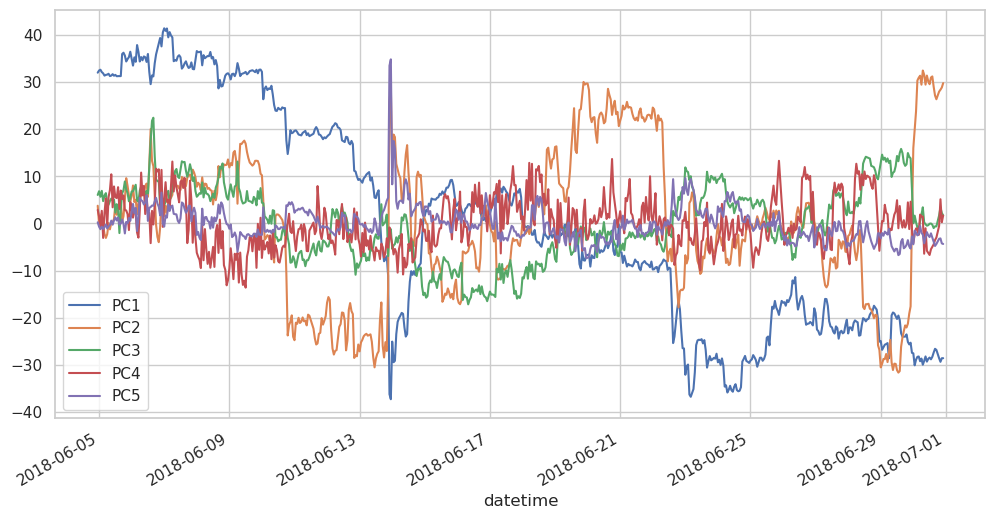

In [120]:
pca_df.plot(figsize=(12, 6))

In [121]:
# explained variance

explained_variance = pca.explained_variance_ratio_.cumsum()
explained_variance

array([0.52829288, 0.77249129, 0.83438432, 0.86407452, 0.87868263])

In [122]:
ob_features_scaled.shape

(621, 960)

In [123]:
# see PCA loadings
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
loadings_df = pd.DataFrame(loadings, index=ob_features.columns[1:], columns=pca_df.columns[:])
#loadings_df = loadings_df.sort_values(by="PC1", ascending=False)

In [124]:
loadings_df

,PC1,PC2,PC3,PC4,PC5
bid_volume_t-1,-0.889053,0.332537,0.265755,-0.078613,-0.078767
bid_volume_t-2,-0.889269,0.332514,0.264472,-0.078574,-0.076760
bid_volume_t-3,-0.890536,0.329341,0.265086,-0.079072,-0.074962
bid_volume_t-4,-0.889647,0.331147,0.264807,-0.078568,-0.079175
bid_volume_t-5,-0.890177,0.330048,0.264674,-0.077383,-0.078340
...,...,...,...,...,...
weighted_spread_t-116,-0.647962,0.621582,0.094052,0.008717,0.166729
weighted_spread_t-117,-0.646904,0.609278,0.082494,0.017585,0.245361
weighted_spread_t-118,-0.659265,0.611752,0.095674,0.018878,0.153009
weighted_spread_t-119,-0.649639,0.617786,0.098035,0.005344,0.160015


In [125]:
loadings_df.loc[loadings_df.index.str.contains("bid_volume"),:]

,PC1,PC2,PC3,PC4,PC5
bid_volume_t-1,-0.889053,0.332537,0.265755,-0.078613,-0.078767
bid_volume_t-2,-0.889269,0.332514,0.264472,-0.078574,-0.076760
bid_volume_t-3,-0.890536,0.329341,0.265086,-0.079072,-0.074962
bid_volume_t-4,-0.889647,0.331147,0.264807,-0.078568,-0.079175
bid_volume_t-5,-0.890177,0.330048,0.264674,-0.077383,-0.078340
...,...,...,...,...,...
bid_volume_t-116,-0.892133,0.327158,0.269815,-0.077226,-0.066654
bid_volume_t-117,-0.891845,0.328606,0.268122,-0.077644,-0.067727
bid_volume_t-118,-0.891578,0.329124,0.269275,-0.078600,-0.064692
bid_volume_t-119,-0.891732,0.329360,0.268384,-0.078063,-0.064035


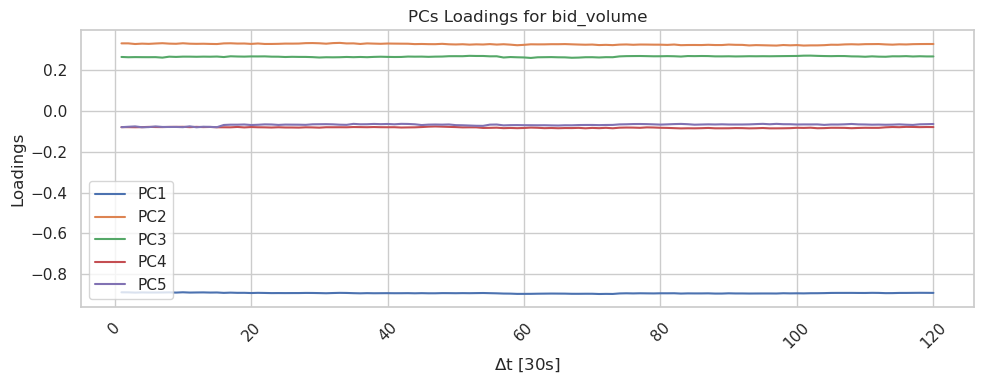

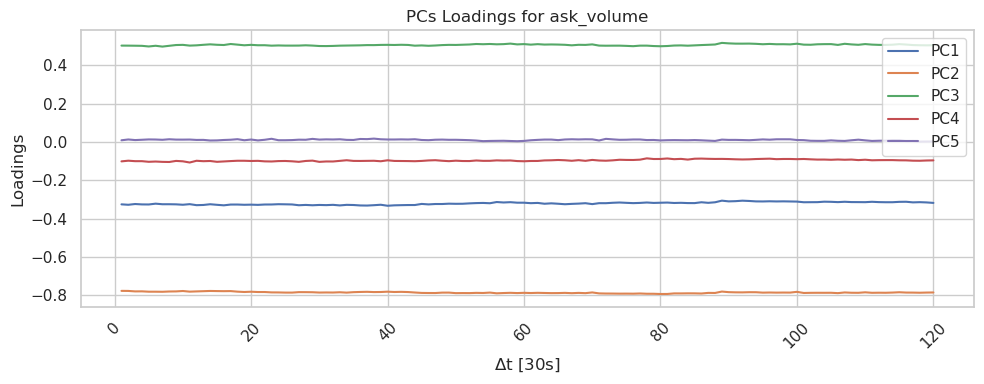

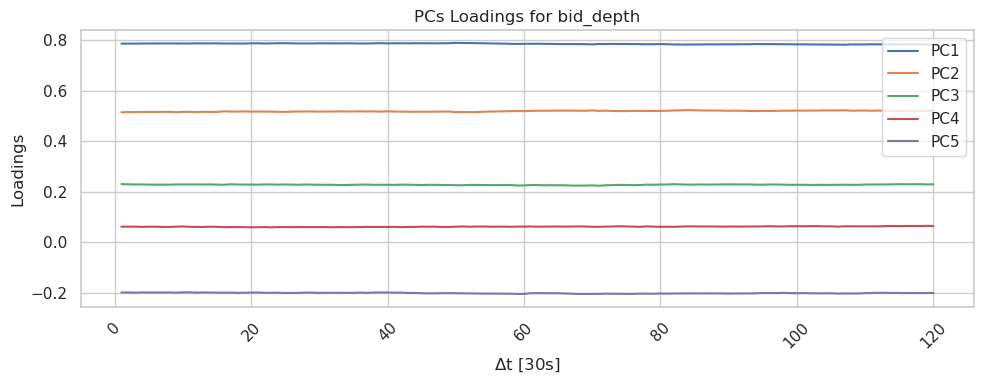

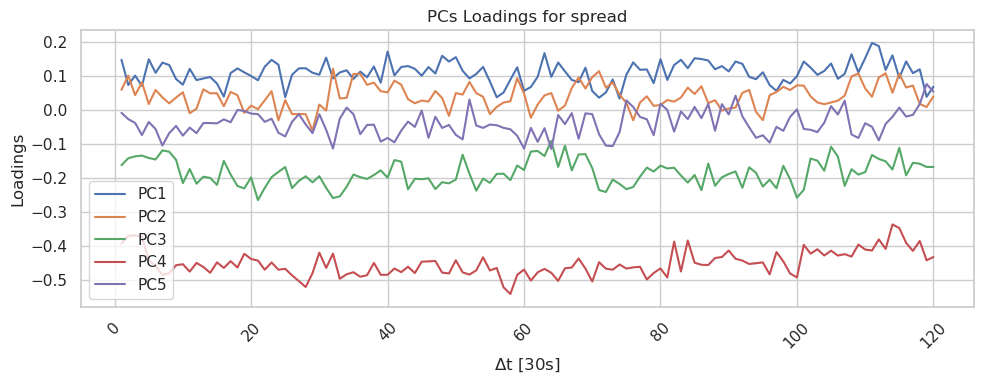

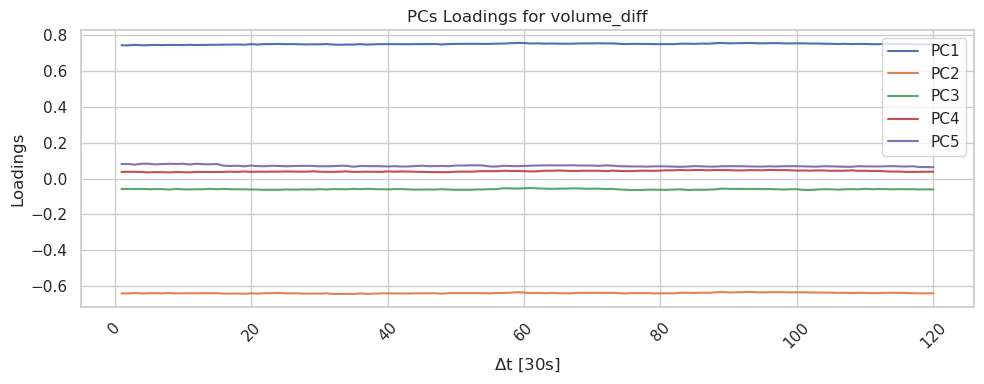

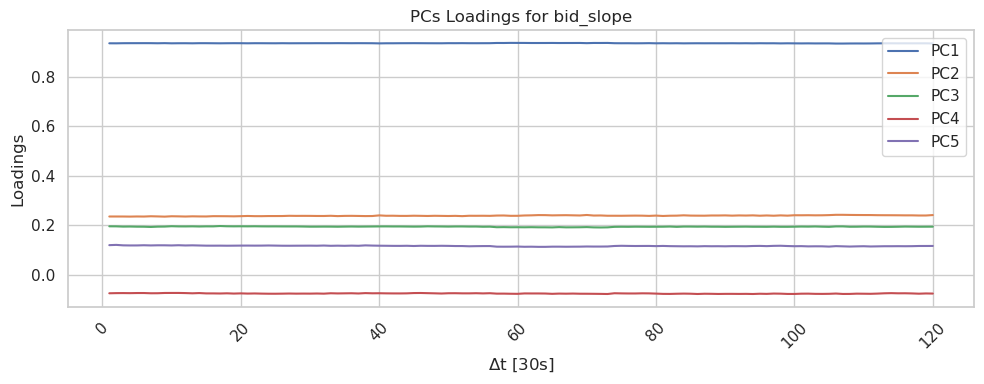

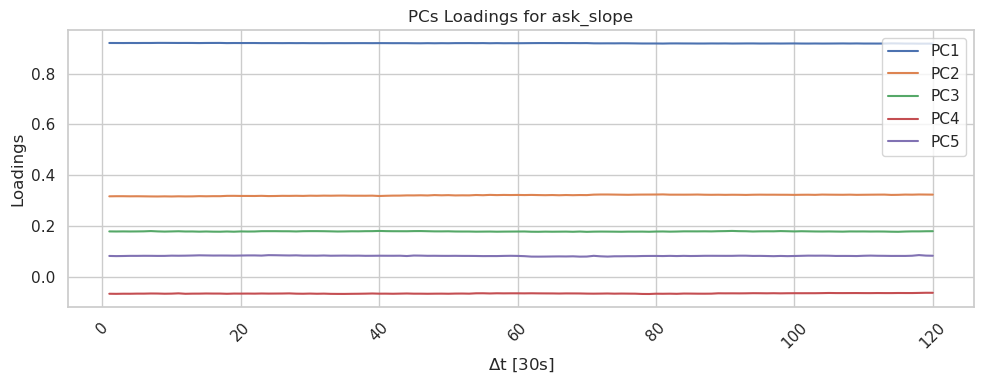

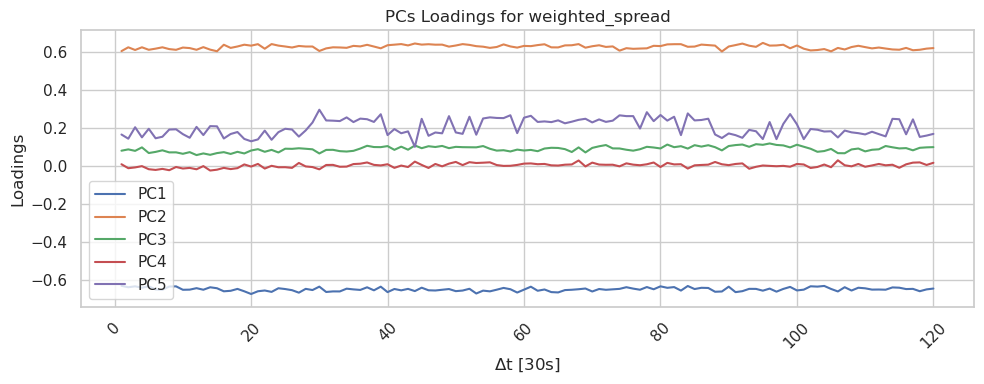

In [126]:
# for each feature in feature_names, slect features from loadings_df which have
# the feature_name as prefix, sort them by sufix and plot loadings
for feature in feature_names:
    feature_loadings_temp = loadings_df.loc[loadings_df.index.str.startswith(feature),:]
    # transform sufix to time variable
    feature_loadings_temp.index = feature_loadings_temp.index.str.replace(f"{feature}_t-", "").astype(int)
    feature_loadings_temp = feature_loadings_temp.sort_index()
    plt.figure(figsize=(10, 4))
    plt.plot(feature_loadings_temp.index, feature_loadings_temp)
    plt.legend(feature_loadings_temp.columns)
    plt.title(f"PCs Loadings for {feature}")
    plt.xlabel(r"$\Delta$t [30s]" )
    plt.ylabel("Loadings")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [127]:
# for each PC, average the loadings over time delta for each feature
mean_loadings = pd.DataFrame(index=feature_names, columns=pca_df.columns[:])
for pc in pca_df.columns:
    for feature in feature_names:
        mean_load = loadings_df.loc[loadings_df.index.str.startswith(feature), pc].values.mean()
        mean_loadings.loc[feature, pc] = mean_load

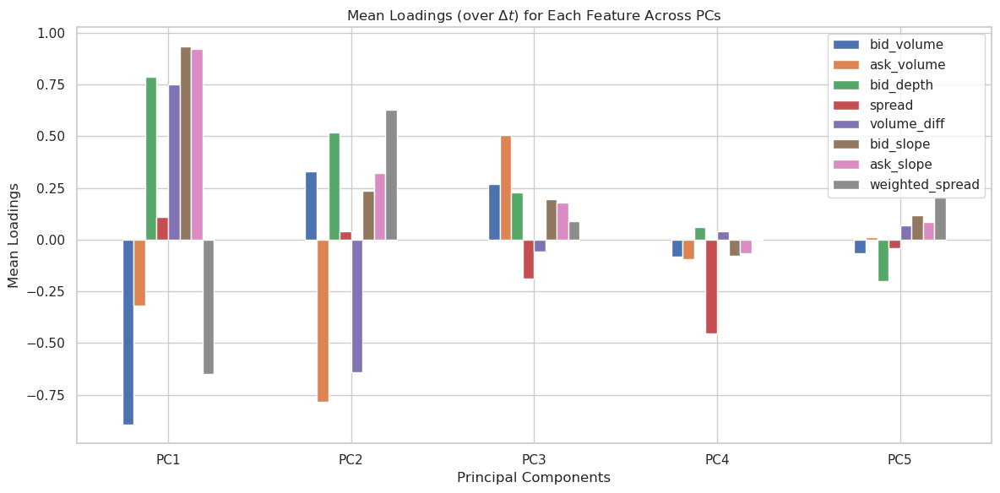

In [128]:
# plot mean loadings
mean_loadings_tr = mean_loadings.T
mean_loadings_tr.plot(kind="bar", figsize=(12, 6))
plt.title(r"Mean Loadings (over $\Delta t$) for Each Feature Across PCs")
plt.xlabel("Principal Components")
plt.ylabel("Mean Loadings")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

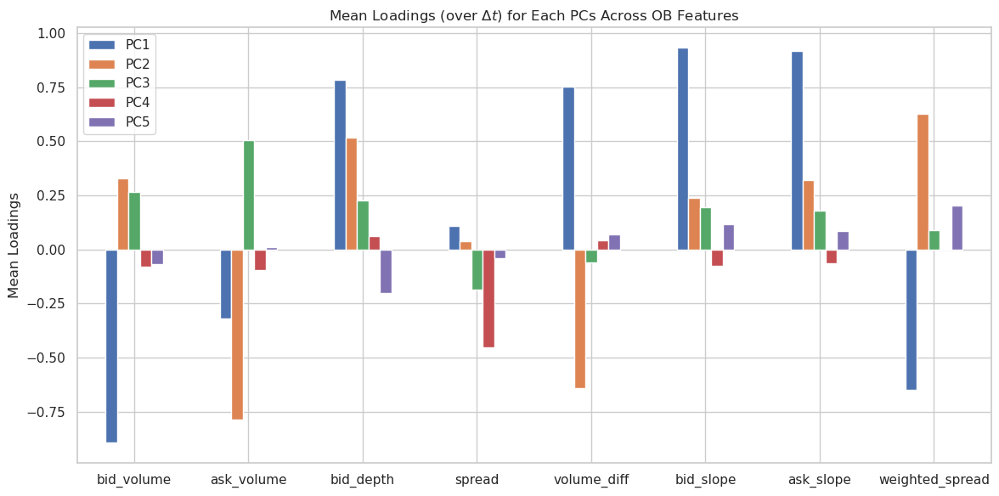

In [129]:
mean_loadings.plot(kind="bar", figsize=(12, 6))
plt.title(r"Mean Loadings (over $\Delta t$) for Each PCs Across OB Features")
#plt.xlabel("Principal Components")
plt.ylabel("Mean Loadings")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Conclusions

- Loadings of PCs over same OB features are independent of $\Delta t$, as expected. So each PC is a weighted sum of the same OB features with weights are independent of $\Delta t$. It means we can use 5 PCs instead of level (means over $\Delta t$) of the original 8 OB features.
- Thus PCA effectively reduces the number of OB features from 8 to 5, not from 1190 to 5, to explain $\approx$ 90% of variance.
- PC1, PC2 and PC5 have to obvious interpretation,
- PC3 is some kind of general volume,
- PC4 is close to the spread

**We will, instead of PCA, try to compute summary statistics of OB features in hourly windows, such as mean and trend, which can be used as features in linear models.**

# Feature Engineering

The goal here is to compute features which are summary features of raw (30s freq.) OB features from hourly windows.

There are _ types of information we aim to extract from the hourly windows:
1. **Level** of the OB features, i.e. mean value of the OB features in the hourly window, or median, which would represent the central tendency of the OB features in the hourly window.
2. **Dispersion** of the OB features, i.e. standard deviation of the OB features in the hourly window, or interquartile range (75th quantile - 25th quantile for simplicity), which would represent volatility of the OB features.
3. **Trend** of the OB features in the window. We obtain them as the difference between the mean value of the OB features in the first 15 minutes and the mean value in the whole hour, scaled by the mean value of the OB feature in the whole hourly window, or analogy of these features using medians. Another idea explored is to fit linear regression of the features vs time, and record the slope of the regression as a short term trend.


Before we proceed, note that `volume_diff` as a difference between two volume features will not contribute to linear models. We will drop this feature, as well as `ask_depth` which is constant for the most of the time, and `depth_diff` which is colinear with `bid_depth` (because `ask_depth` is a constant).

We will compute some candidate features, and select those which are somewhat correlated with the target variable. In case two feature are very correlated between each other, we will select one of them (the one with higher correlation with the target variable). Also, some features with highly skewed distribution will be transformed to log scale (case with interquartile range features). We will also tend to scale the features such as trend or dispersion by the mean or median to make them into relative trend or dispersion features.

In [37]:
LAST_TRAINING_DATE = datetime.strptime("2018-07-01 00:00:00", "%Y-%m-%d %H:%M:%S")

training_data = (
    pl.read_csv(data_path / "btc" / "data_df_with_volume.csv")
    .with_columns(pl.col("datetime").str.to_datetime("%Y-%m-%d %H:%M:%S"))
    .sort("datetime")
).to_pandas().set_index("datetime").loc[:LAST_TRAINING_DATE]

training_data.loc[:, "log_vol"] = np.log(training_data.loc[:, "vol"])


In [38]:
# the same two redundant features are eliminated
columns_list = [
    "spread", 
    # "ask_depth", 
    "bid_depth", 
    # "depth_diff", 
    "ask_volume", 
    "bid_volume", 
    # "volume_diff", 
    "weighted_spread", 
    "ask_slope", 
    "bid_slope",
]

In [39]:
for col in columns_list:
    training_data[f'mean_{col}'] = training_data.loc[:, training_data.columns.str.startswith(col)].mean(axis=1)
    training_data[f'median_{col}'] = training_data.loc[:, training_data.columns.str.startswith(col)].median(axis=1)


    training_data[f'trend_{col}'] = training_data.loc[:, training_data.columns.str.startswith(col)].apply(
        lambda x: np.polyfit(range(len(x)), x, 1)[0], axis=1
    )
    
    columns_to_use = training_data.columns[training_data.columns.str.startswith(col)]
    # sort columns by the time delta, e.g. "bid_volume_t-1", "bid_volume_t-2", ..., "bid_volume_t-60"
    columns_to_use = sorted(columns_to_use, key=lambda x: int(x.split("_t-")[-1]))

    # robust trend = mean of the first 60 values minus the mean of the last 60 values
    training_data[f'robust_trend_{col}'] = (
        training_data.loc[:, columns_to_use[:60]].mean(axis=1) - training_data.loc[:, columns_to_use[60:]].mean(axis=1)
    )

    # robust trend = mean of the first 60 values minus the mean of the last 60 values
    training_data[f'15m_trend_{col}'] = (
        (training_data.loc[:, columns_to_use[:30]].median(axis=1) - training_data.loc[:, columns_to_use[:]].median(axis=1))/ training_data.loc[:, columns_to_use[:]].median(axis=1)
    )

    training_data[f'iq_range_{col}'] = (
        np.log(0.0001+(training_data.loc[:, columns_to_use[:]].quantile(0.75, axis=1) - training_data.loc[:, columns_to_use[:]].quantile(0.25, axis=1))/ training_data.loc[:, columns_to_use[:]].median(axis=1))
    )



In [40]:
training_data

,vol,ret,ret_t-1,ret_t-2,ret_t-3,ret_t-4,ret_t-5,ret_t-6,ret_t-7,ret_t-8,...,trend_ask_slope,robust_trend_ask_slope,15m_trend_ask_slope,iq_range_ask_slope,mean_bid_slope,median_bid_slope,trend_bid_slope,robust_trend_bid_slope,15m_trend_bid_slope,iq_range_bid_slope
datetime,,,,,,,,,,,,,,,,,,,,,
2018-06-04 23:00:00,0.000143,-0.002229,-0.000807,-0.001664,-0.002068,0.001077,-2.260213e-03,0.000301,0.000990,0.000041,...,-0.216389,11.792833,0.001323,-6.731884,6969.211333,6970.00,0.232913,-10.613333,-0.000859,-6.390893
2018-06-05 00:00:00,0.000115,0.001552,-0.000217,-0.002412,-0.000731,-0.000816,6.114784e-04,0.000842,-0.000742,0.001837,...,0.033065,-2.378333,0.000859,-6.096072,6940.756083,6946.64,-0.456597,34.153500,0.002500,-5.329862
2018-06-05 01:00:00,0.000090,-0.001719,0.001004,0.000560,0.000503,-0.000766,-4.134436e-05,-0.000289,-0.000918,0.000120,...,-0.206673,14.801333,0.001231,-6.135044,6944.465667,6945.00,0.751867,-38.293333,-0.002258,-5.123113
2018-06-05 02:00:00,0.000502,-0.010899,0.000669,0.000013,-0.000724,0.000081,-1.211971e-03,0.001144,-0.000175,-0.000356,...,-0.266418,17.467333,0.002226,-5.699906,6969.692333,6970.00,-0.102248,4.358333,0.000000,-6.949205
2018-06-05 03:00:00,0.000146,0.000408,0.000473,-0.003603,-0.000386,-0.004847,-1.068085e-03,0.000396,0.001105,0.000261,...,-0.417405,23.816167,0.004935,-5.607817,6921.164667,6929.32,-0.817627,41.923333,0.005871,-4.882077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-30 17:00:00,0.000154,0.000137,-0.001404,-0.001003,0.001435,-0.003639,2.601149e-04,0.000169,-0.000772,0.001503,...,-0.126664,6.549833,0.001043,-6.237834,5766.342083,5760.32,0.226982,-16.240833,-0.001792,-5.071527
2018-06-30 19:00:00,0.000089,0.000182,-0.000755,-0.000203,-0.000274,0.000394,-5.000189e-04,-0.000609,-0.001491,-0.000519,...,-0.150581,9.307333,0.001508,-6.350521,5797.928917,5800.00,0.029430,-0.931167,0.000000,-9.210340
2018-06-30 20:00:00,0.000202,0.005612,-0.000558,0.000508,-0.000757,0.000989,-4.440892e-16,0.000044,0.000955,-0.000316,...,0.045810,-3.615167,-0.000314,-6.746690,5791.052917,5789.16,0.036891,-1.850833,0.000000,-6.228471


In [41]:
cols_of_int = training_data.columns[training_data.columns.str.startswith("mean")].tolist() + \
    training_data.columns[training_data.columns.str.startswith("median")].tolist() + \
    training_data.columns[training_data.columns.str.startswith("trend")].tolist() + \
    training_data.columns[training_data.columns.str.startswith("robust_trend")].tolist() + \
            training_data.columns[training_data.columns.str.startswith("15m_trend")].tolist() + \
    training_data.columns[training_data.columns.str.startswith("iq_range")].tolist() 

In [42]:
cols_of_int

['mean_spread',
 'mean_bid_depth',
 'mean_ask_volume',
 'mean_bid_volume',
 'mean_weighted_spread',
 'mean_ask_slope',
 'mean_bid_slope',
 'median_spread',
 'median_bid_depth',
 'median_ask_volume',
 'median_bid_volume',
 'median_weighted_spread',
 'median_ask_slope',
 'median_bid_slope',
 'trend_spread',
 'trend_bid_depth',
 'trend_ask_volume',
 'trend_bid_volume',
 'trend_weighted_spread',
 'trend_ask_slope',
 'trend_bid_slope',
 'robust_trend_spread',
 'robust_trend_bid_depth',
 'robust_trend_ask_volume',
 'robust_trend_bid_volume',
 'robust_trend_weighted_spread',
 'robust_trend_ask_slope',
 'robust_trend_bid_slope',
 '15m_trend_spread',
 '15m_trend_bid_depth',
 '15m_trend_ask_volume',
 '15m_trend_bid_volume',
 '15m_trend_weighted_spread',
 '15m_trend_ask_slope',
 '15m_trend_bid_slope',
 'iq_range_spread',
 'iq_range_bid_depth',
 'iq_range_ask_volume',
 'iq_range_bid_volume',
 'iq_range_weighted_spread',
 'iq_range_ask_slope',
 'iq_range_bid_slope']

## Selection of Central Tendency Features

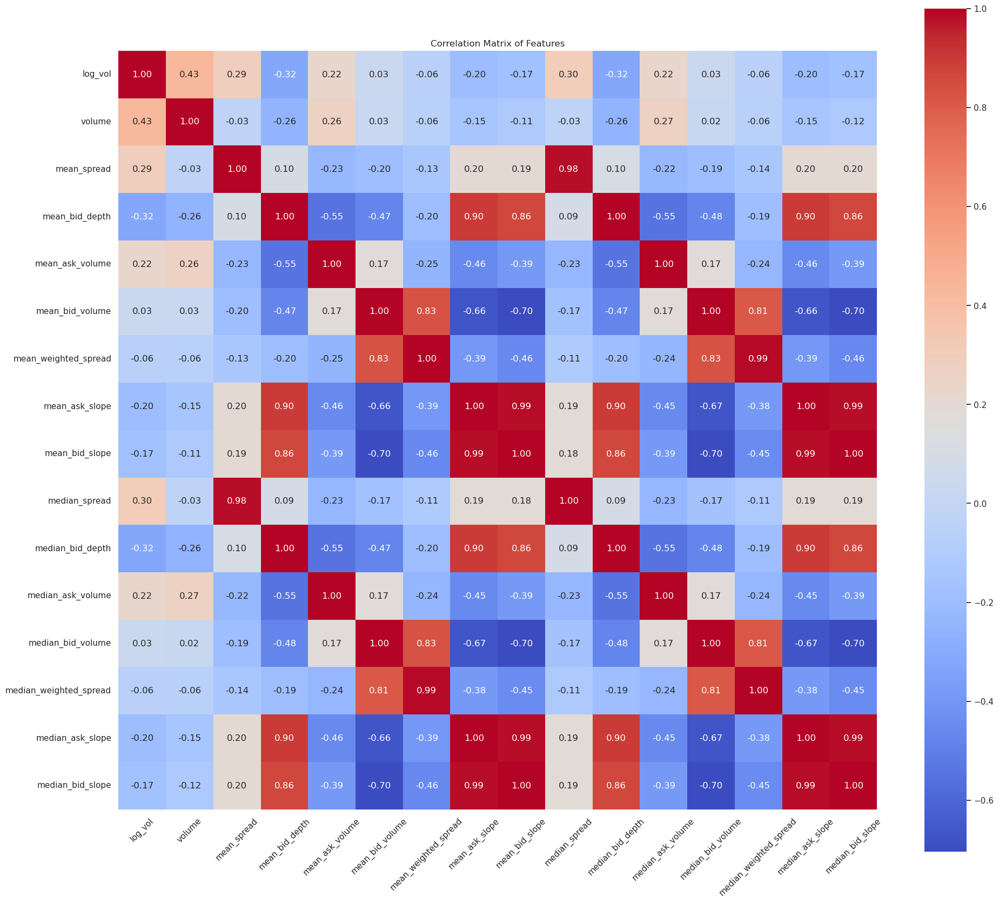

In [43]:
cols_of_int_small = [
 'mean_spread',
 'mean_bid_depth',
 'mean_ask_volume',
 'mean_bid_volume',
 'mean_weighted_spread',
 'mean_ask_slope',
 'mean_bid_slope',
 'median_spread',
 'median_bid_depth',
 'median_ask_volume',
 'median_bid_volume',
 'median_weighted_spread',
 'median_ask_slope',
 'median_bid_slope'
 ]

corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='pearson')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

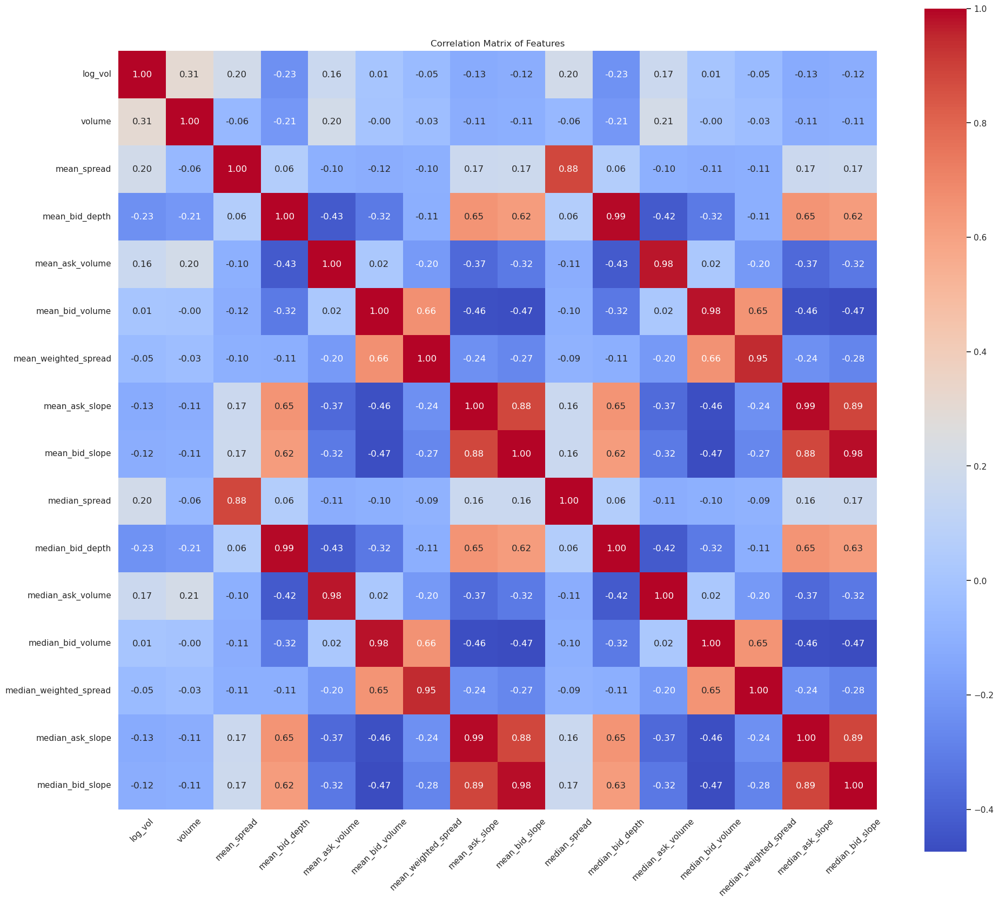

In [44]:
corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='kendall')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

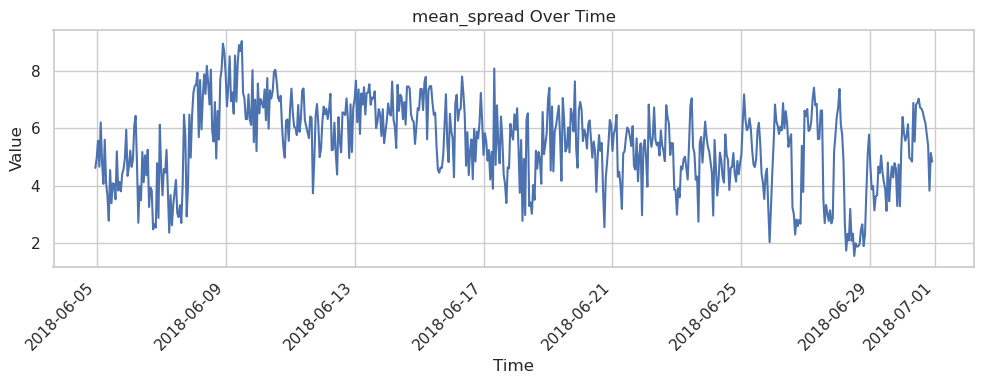

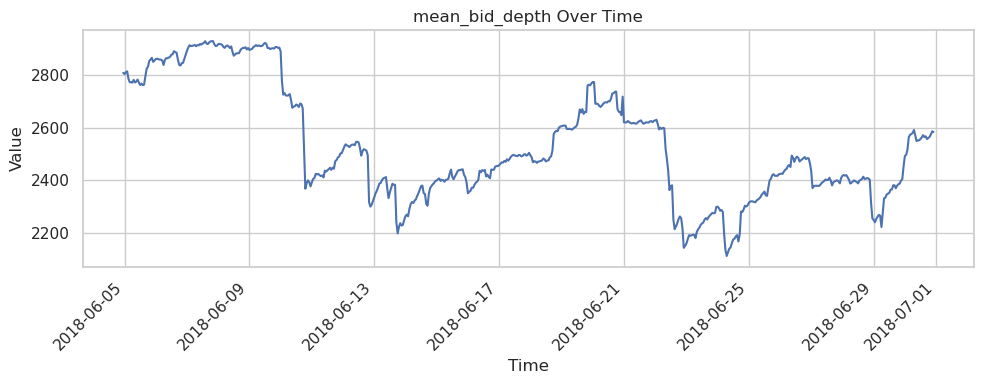

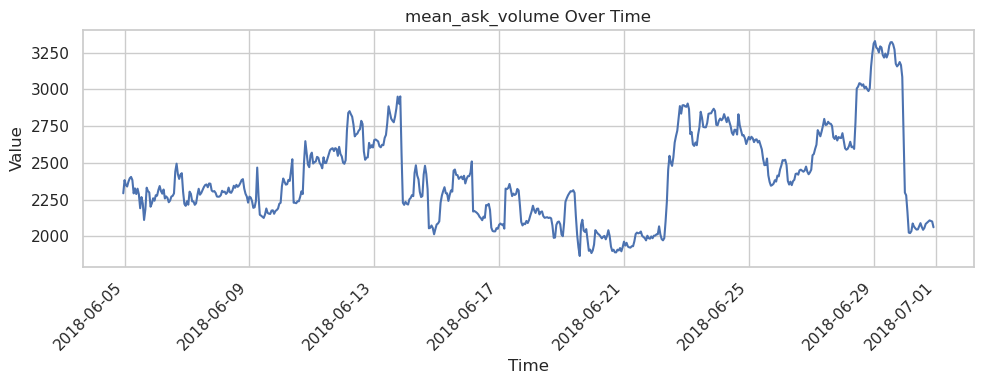

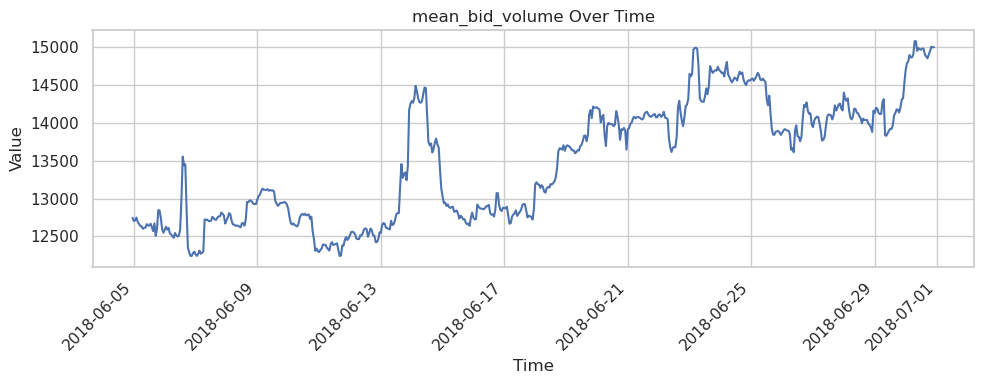

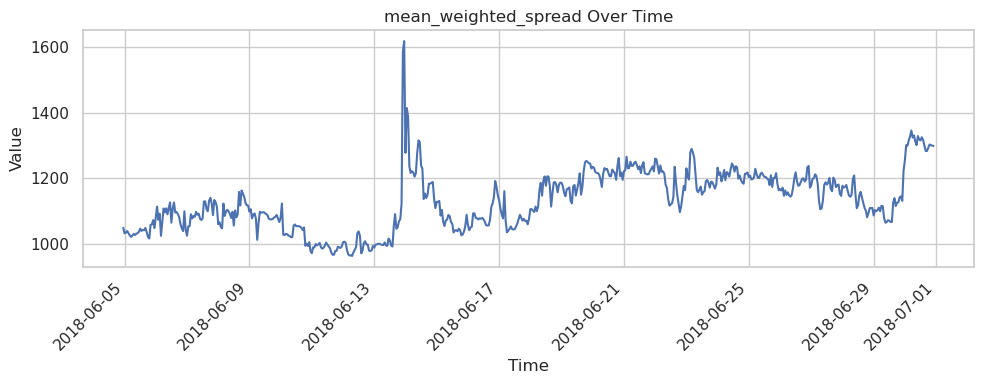

...

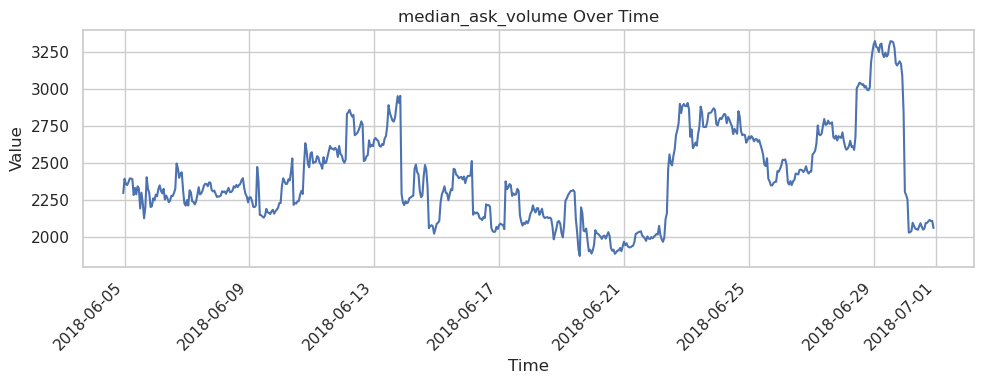

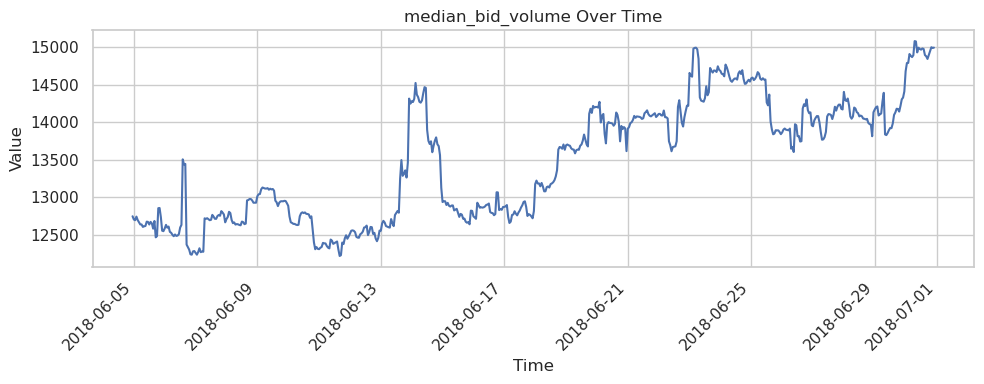

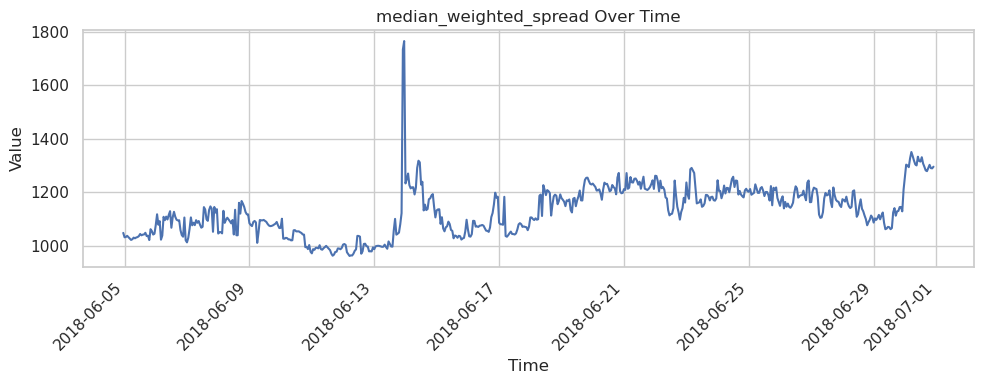

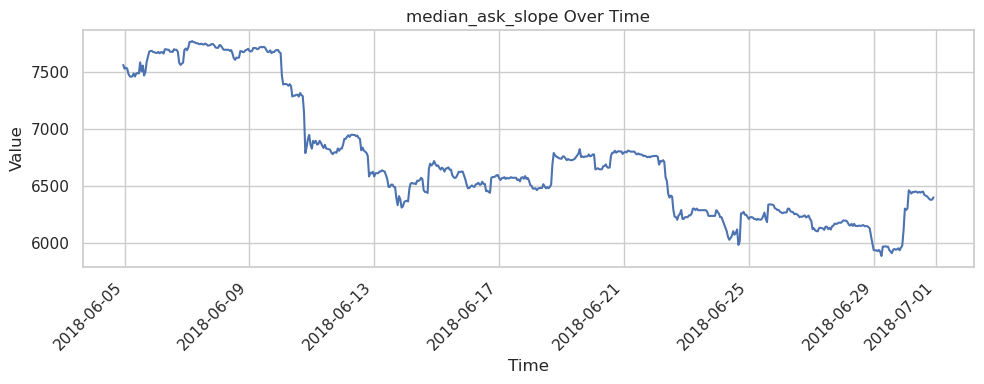

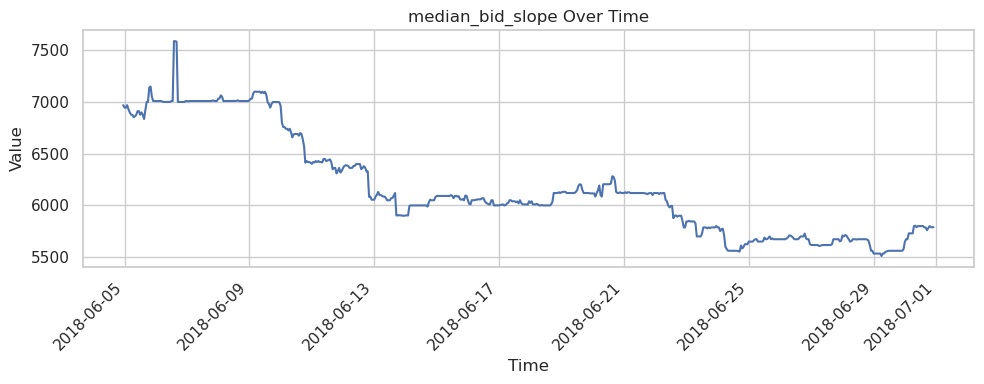

In [31]:
# plot the features
for col in cols_of_int_small:
    plt.figure(figsize=(10, 4))
    training_data[col].plot()
    plt.title(f"{col} Over Time")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


There is virtually no difference between mean and median of the OB features in terms of correlation with the target variable, so we will use mean as a central tendency feature. 

`mean_weighted_spread` and `mean_bid_volume` have very low correlation with the target variable, so we will drop them.
`mean_ask_slope`, `mean_bid_slope` and `mean_bid_depth` are highly correlated with each other, so we keep only `mean_bid_depth` as it is the most correlated with the target variable.

Thus the final list of only 3 central tendency features:

In [ ]:
ct_features = [
'mean_spread',
'mean_bid_depth',
'mean_ask_volume' # also a candidate for dropping, but we keep it for now
]

## Selection of Trend Features

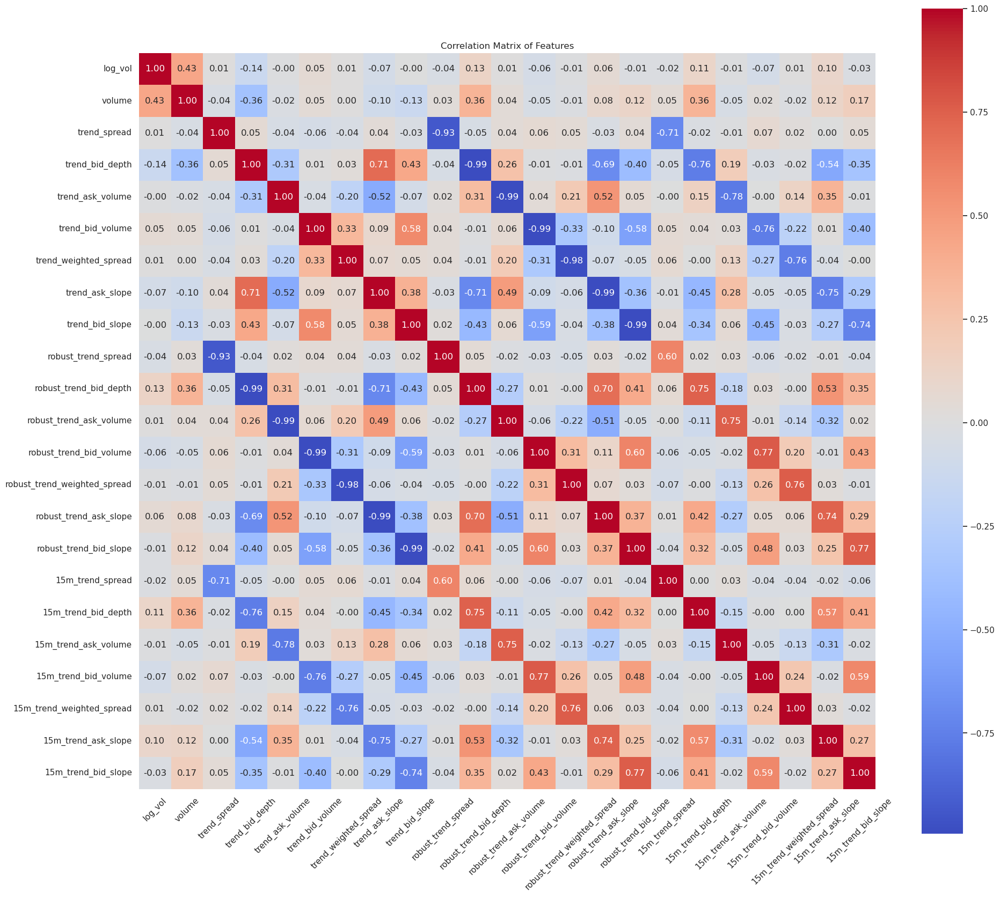

In [34]:
cols_of_int_small = [
 'trend_spread',
 'trend_bid_depth',
 'trend_ask_volume',
 'trend_bid_volume',
 'trend_weighted_spread',
 'trend_ask_slope',
 'trend_bid_slope',
 'robust_trend_spread',
 'robust_trend_bid_depth',
 'robust_trend_ask_volume',
 'robust_trend_bid_volume',
 'robust_trend_weighted_spread',
 'robust_trend_ask_slope',
 'robust_trend_bid_slope',
 '15m_trend_spread',
 '15m_trend_bid_depth',
 '15m_trend_ask_volume',
 '15m_trend_bid_volume',
 '15m_trend_weighted_spread',
 '15m_trend_ask_slope',
 '15m_trend_bid_slope',
 ]

corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='pearson')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

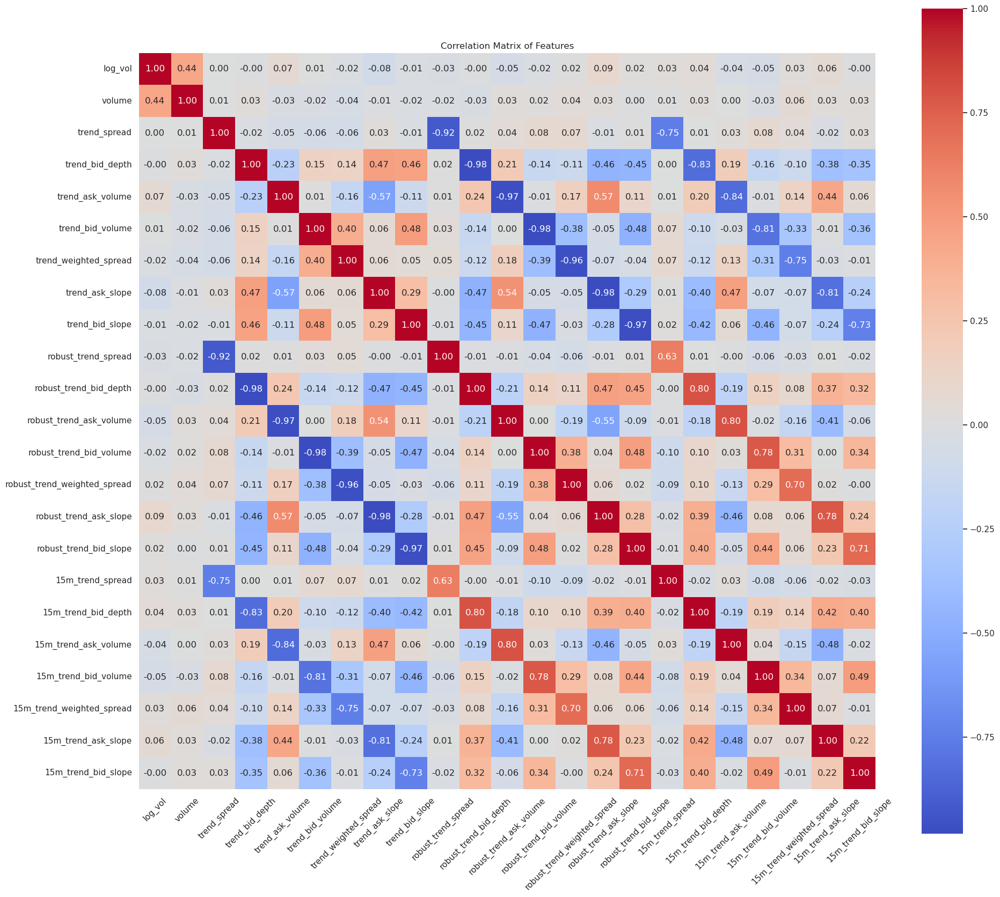

In [26]:
corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='spearman')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

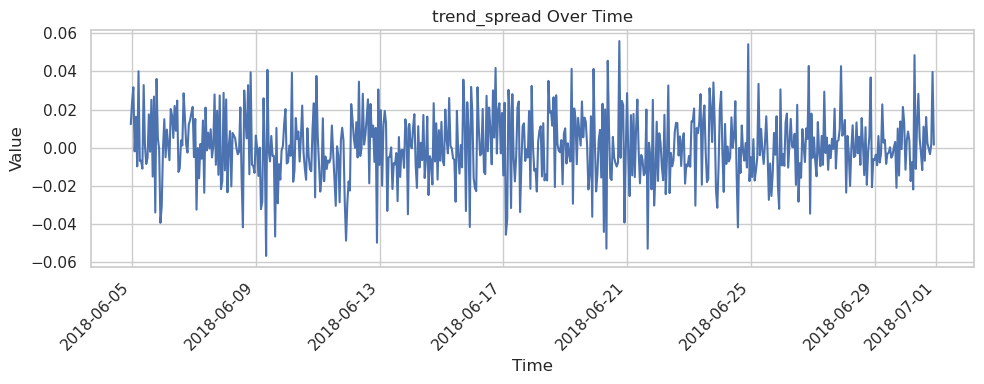

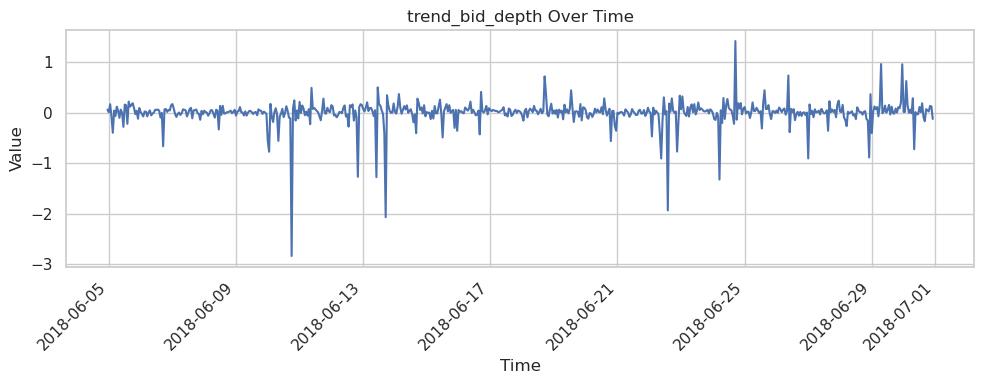

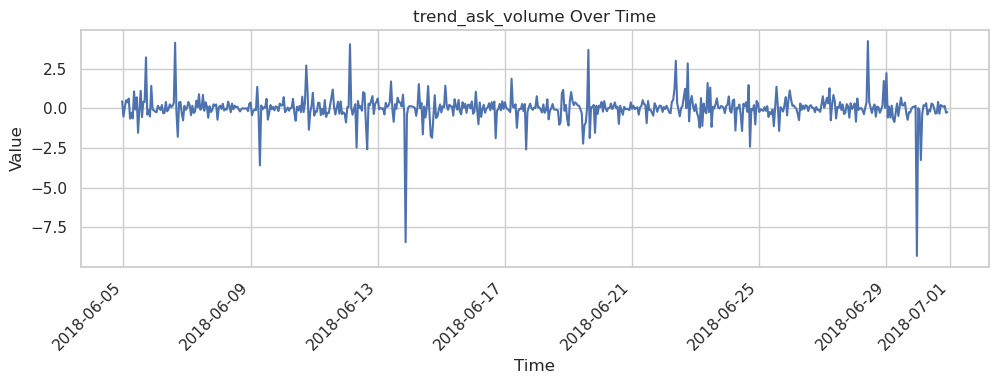

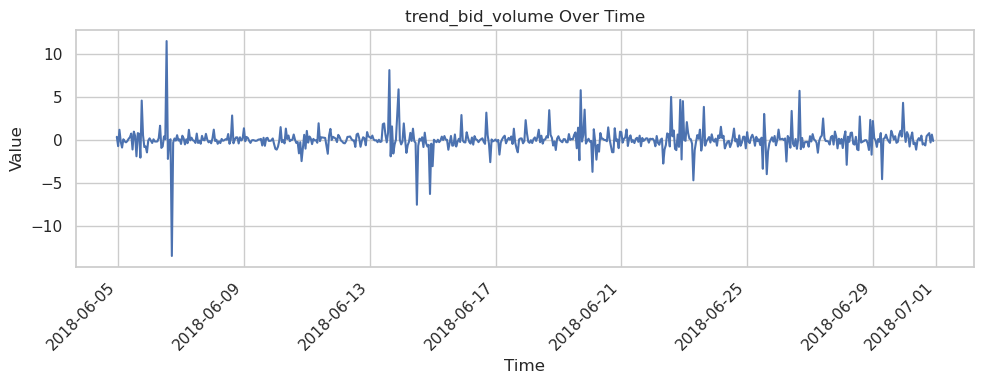

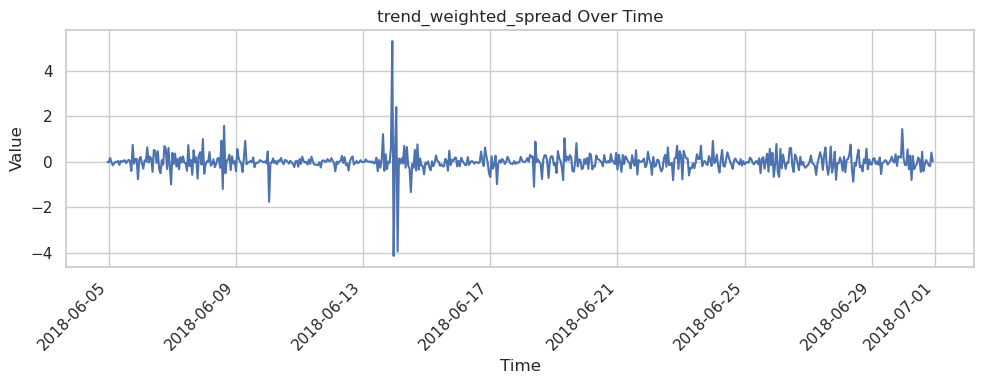

...

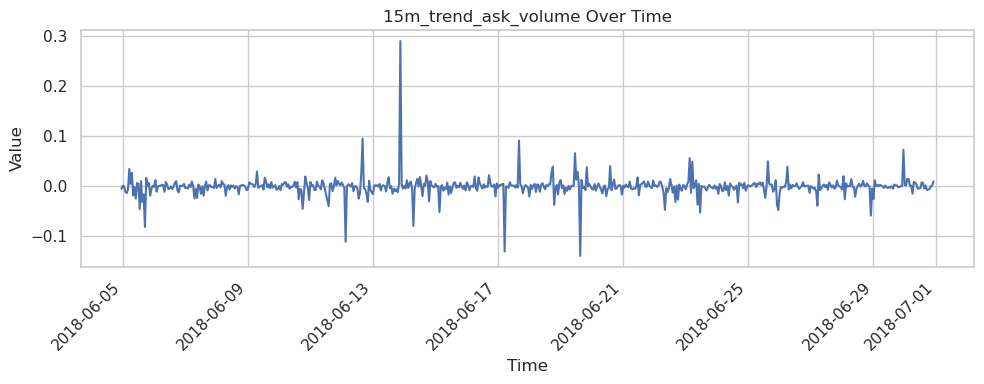

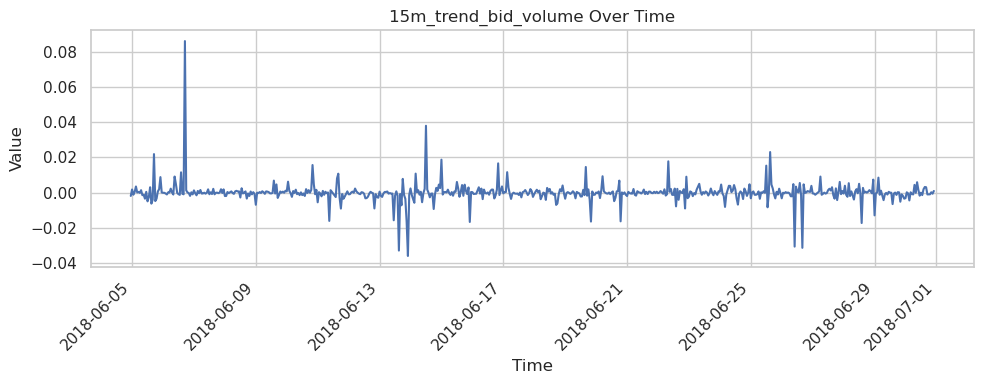

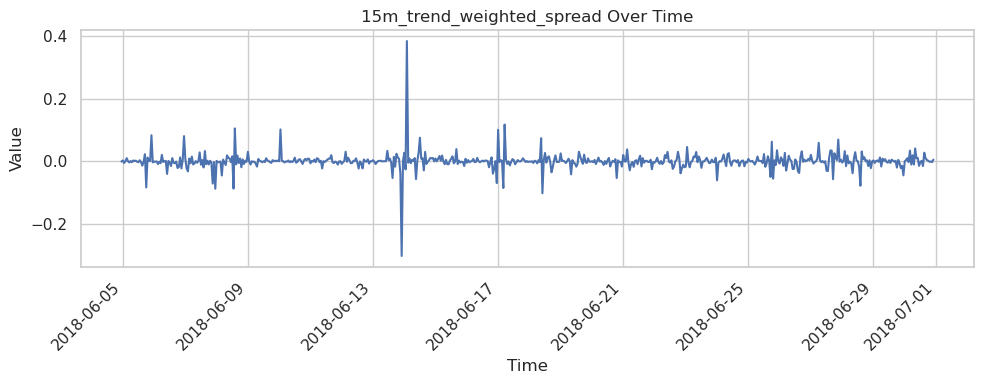

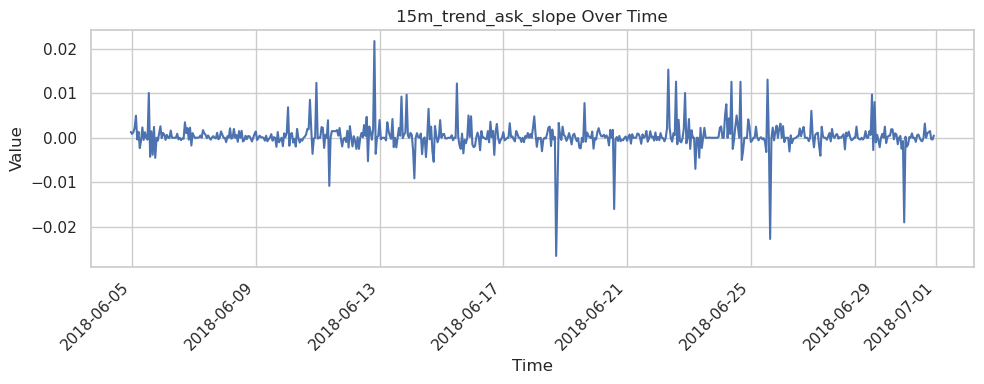

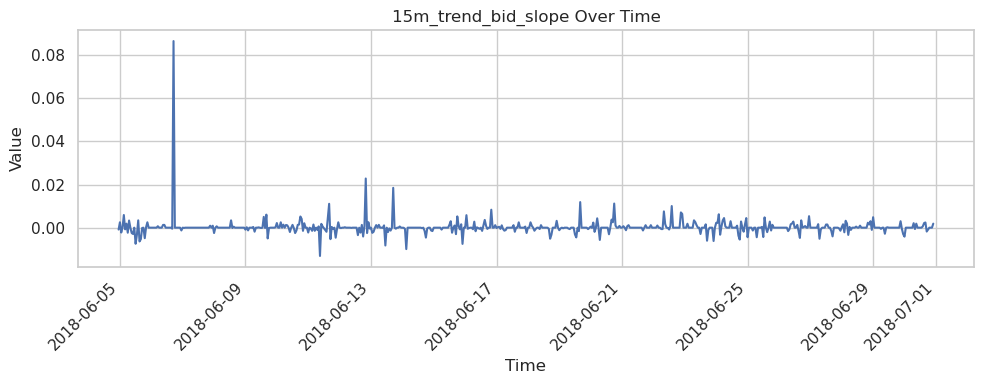

In [27]:
# plot the features
for col in cols_of_int_small:
    plt.figure(figsize=(10, 4))
    training_data[col].plot()
    plt.title(f"{col} Over Time")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


All trend features have very low correlation with the target variable, they are "spiky" over time, meaning that linear models are not going to handle them well. We will drop them all.

## Selection of Dispersion Features

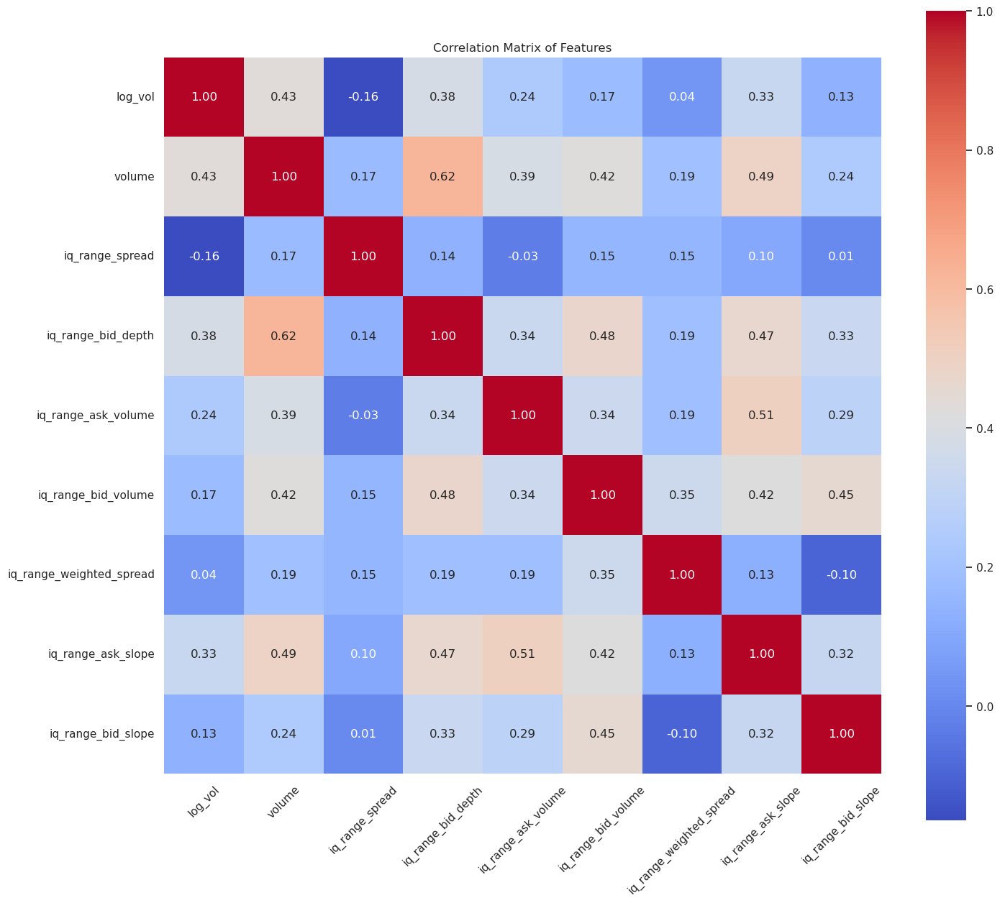

In [36]:
cols_of_int_small = [
 'iq_range_spread',
 'iq_range_bid_depth',
 'iq_range_ask_volume',
 'iq_range_bid_volume',
 'iq_range_weighted_spread',
 'iq_range_ask_slope',
 'iq_range_bid_slope'
 ]

corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='pearson')

 # plot corelation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

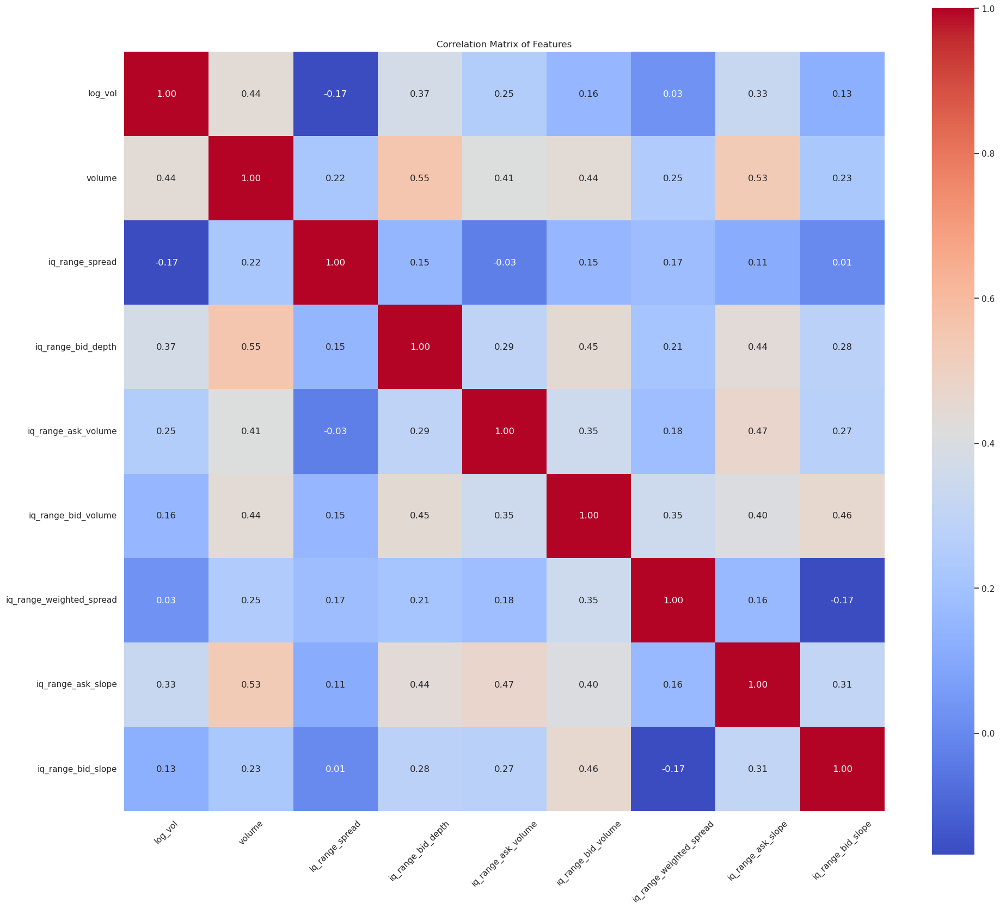

In [37]:
corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='spearman')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

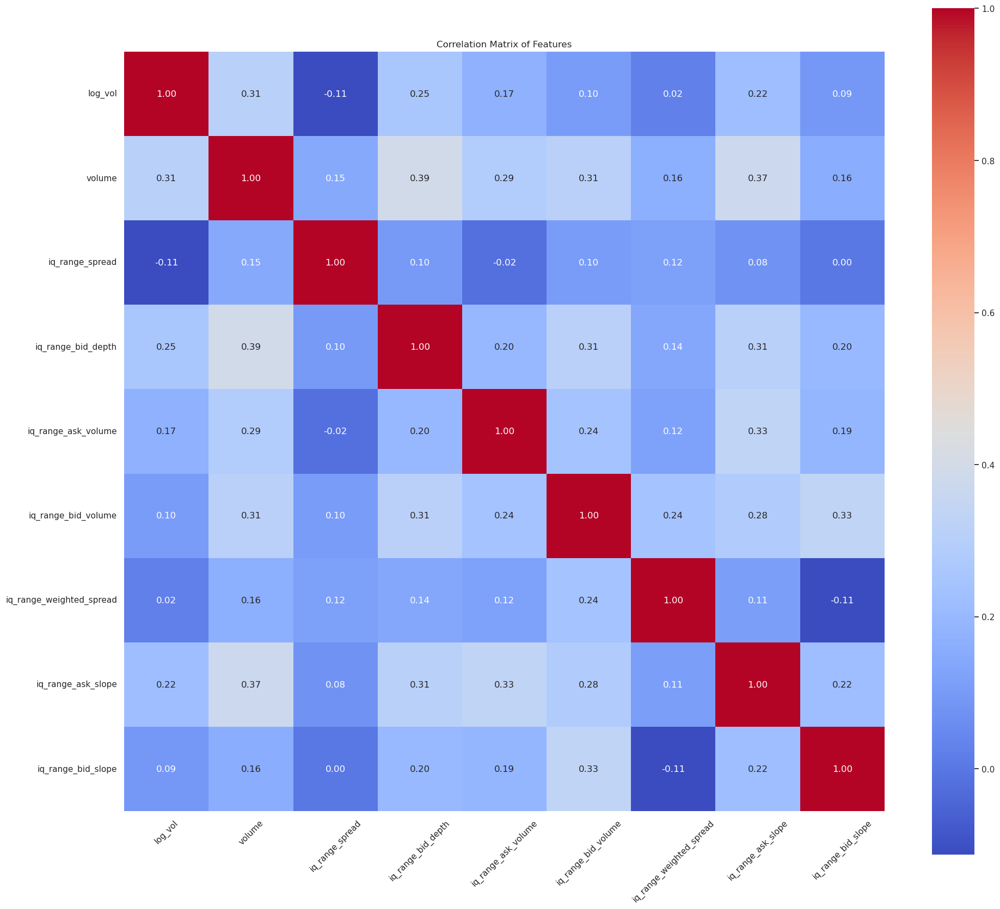

In [38]:
corr = training_data.loc[:, ['log_vol', 'volume']+ cols_of_int_small].corr(method='kendall')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

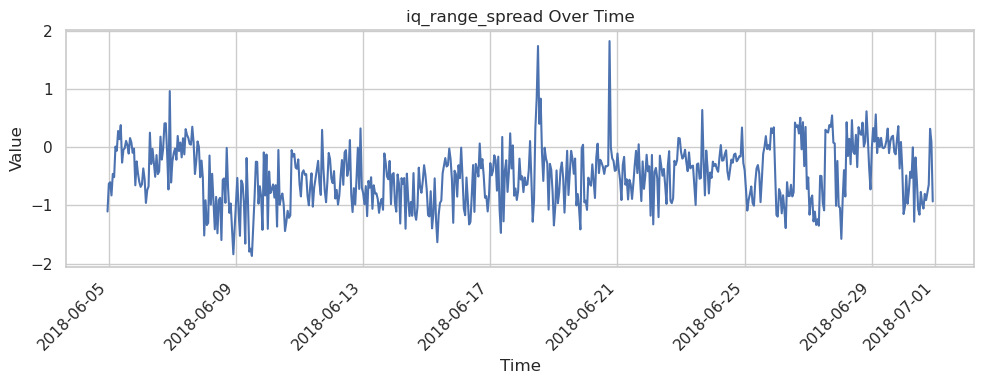

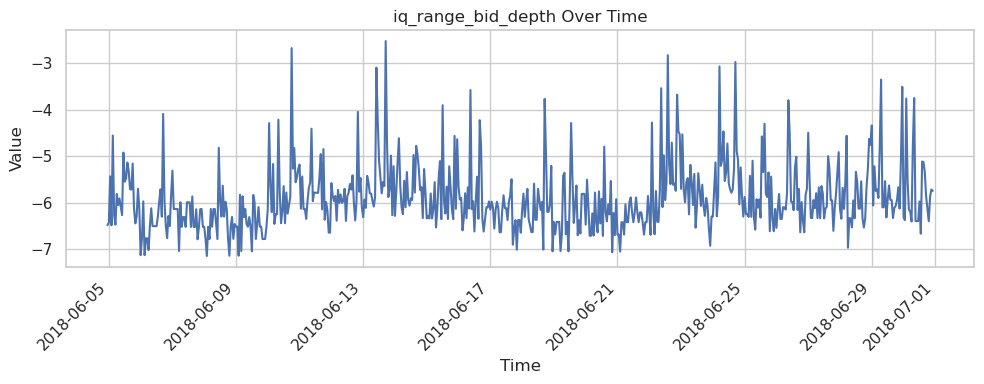

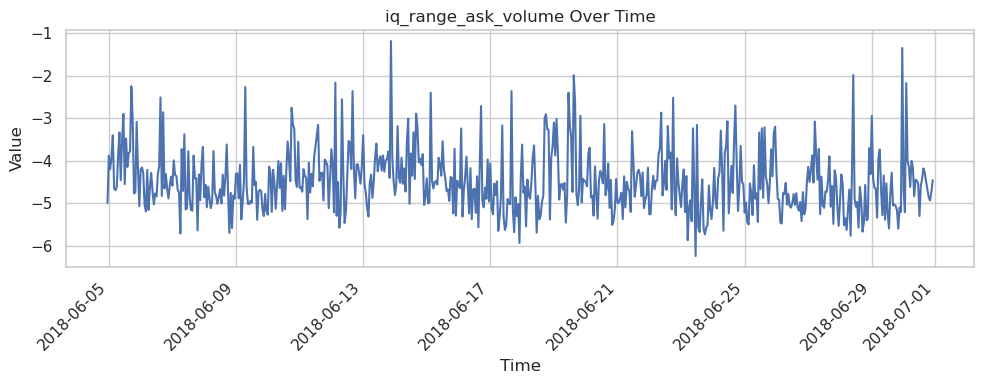

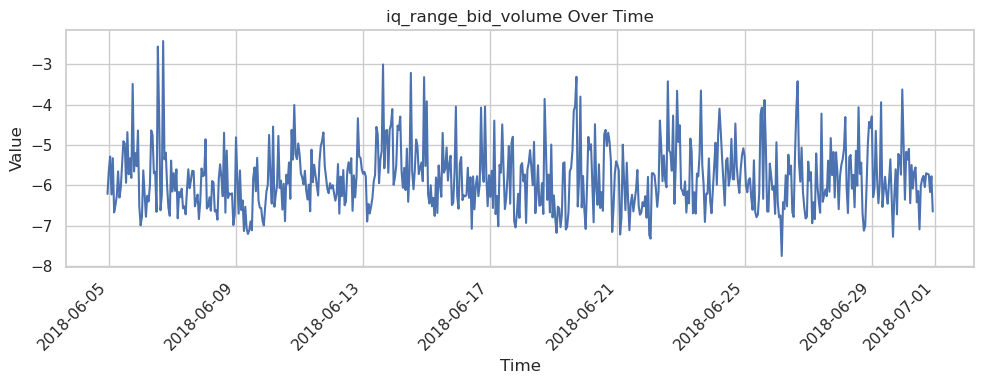

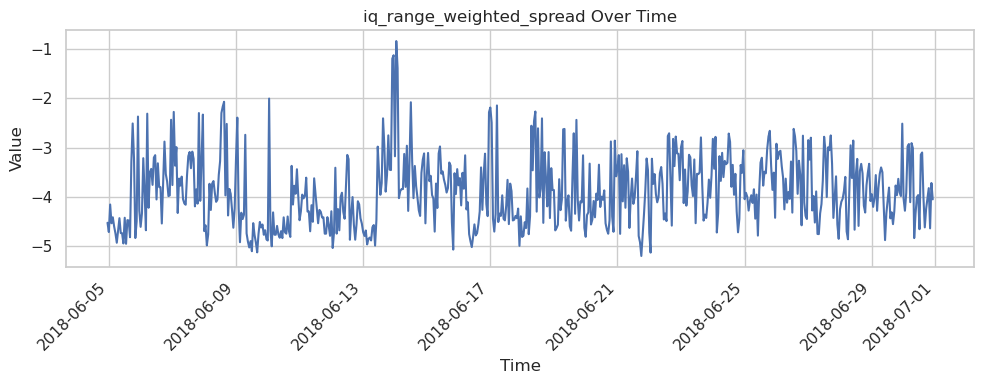

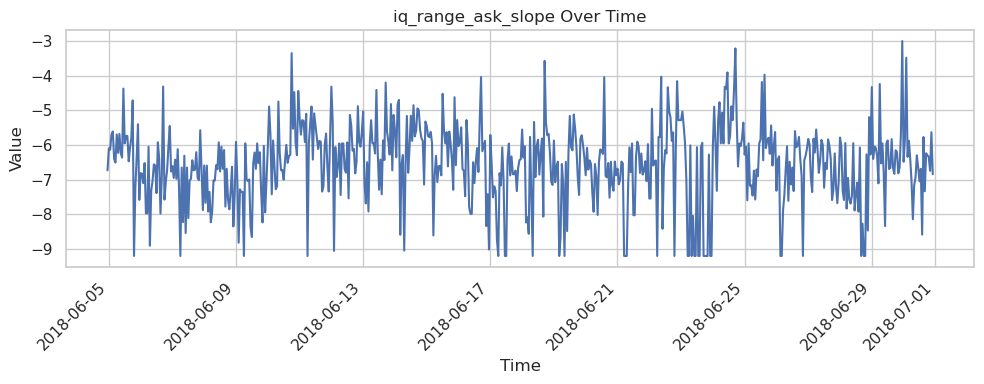

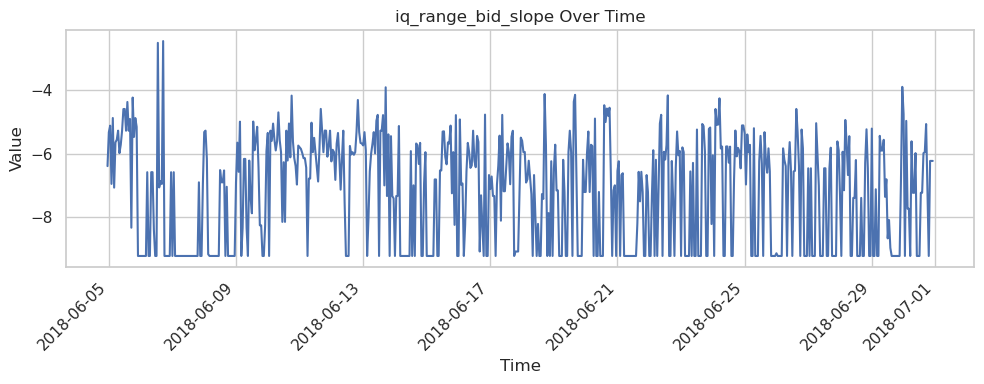

In [39]:
# plot the features
for col in cols_of_int_small:
    plt.figure(figsize=(10, 4))
    training_data[col].plot()
    plt.title(f"{col} Over Time")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


With the similar approach as above, we decide to keep only the following dispersion features:

In [41]:
[
    "iq_range_bid_depth",
    "iq_range_ask_volume",
    "iq_range_ask_slope",
]

['iq_range_bid_depth', 'iq_range_ask_volume', 'iq_range_ask_slope']

## Inspect final OB features

In [7]:
selected_ob_features = [
    'mean_spread',
    'mean_bid_depth',
    'mean_ask_volume',
    "iq_range_bid_depth",
    "iq_range_ask_volume",
    "iq_range_ask_slope",
] 

In [8]:
training_data.loc[:, ['log_volume']] = np.log(training_data.loc[:, 'volume'] + 0.0000001)

In [9]:
selected_training_data = training_data.loc[:, ['log_vol', 'log_volume'] + selected_ob_features]

In [10]:
selected_training_data

,log_vol,log_volume,mean_spread,mean_bid_depth,mean_ask_volume,iq_range_bid_depth,iq_range_ask_volume,iq_range_ask_slope
datetime,,,,,,,,
2018-06-04 23:00:00,-8.855461,4.846414,4.617000,2808.416667,2293.170108,-6.486421,-5.000157,-6.731884
2018-06-05 00:00:00,-9.068099,5.762991,4.955333,2803.741667,2383.019695,-6.427992,-3.885527,-6.096072
2018-06-05 01:00:00,-9.318677,5.233805,5.568167,2810.800000,2348.723498,-5.433582,-4.203833,-6.135044
2018-06-05 02:00:00,-7.596025,5.620033,4.659333,2814.191667,2339.586743,-6.488082,-3.925141,-5.699906
2018-06-05 03:00:00,-8.833278,6.420348,6.203417,2785.916667,2372.844947,-4.553370,-3.400850,-5.607817
...,...,...,...,...,...,...,...,...
2018-06-30 17:00:00,-8.781391,5.782078,6.176167,2557.083333,2092.303235,-5.864425,-4.500541,-6.237834
2018-06-30 19:00:00,-9.323500,5.203841,5.389583,2565.350000,2108.711393,-6.401999,-4.865156,-6.350521
2018-06-30 20:00:00,-8.509267,5.369528,3.821000,2574.766667,2105.123597,-5.871944,-4.938087,-6.746690


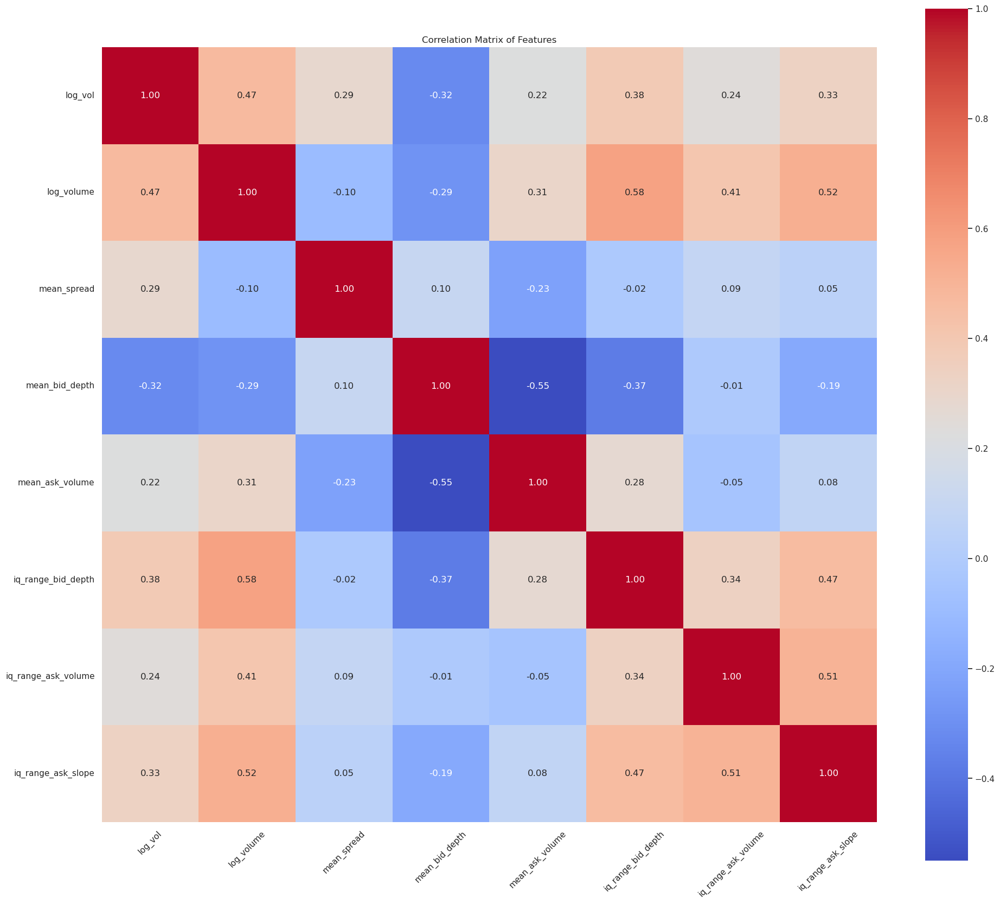

In [11]:
corr = selected_training_data.corr(method='pearson')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

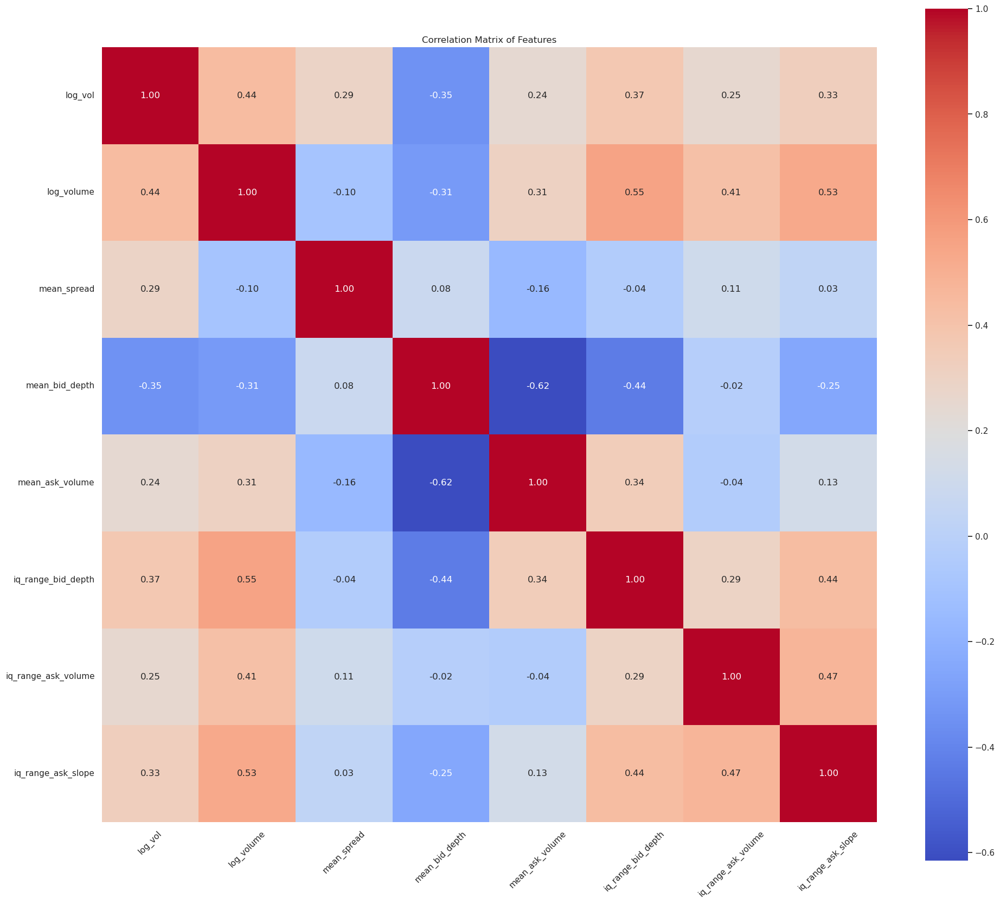

In [12]:
corr = selected_training_data.corr(method='spearman')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

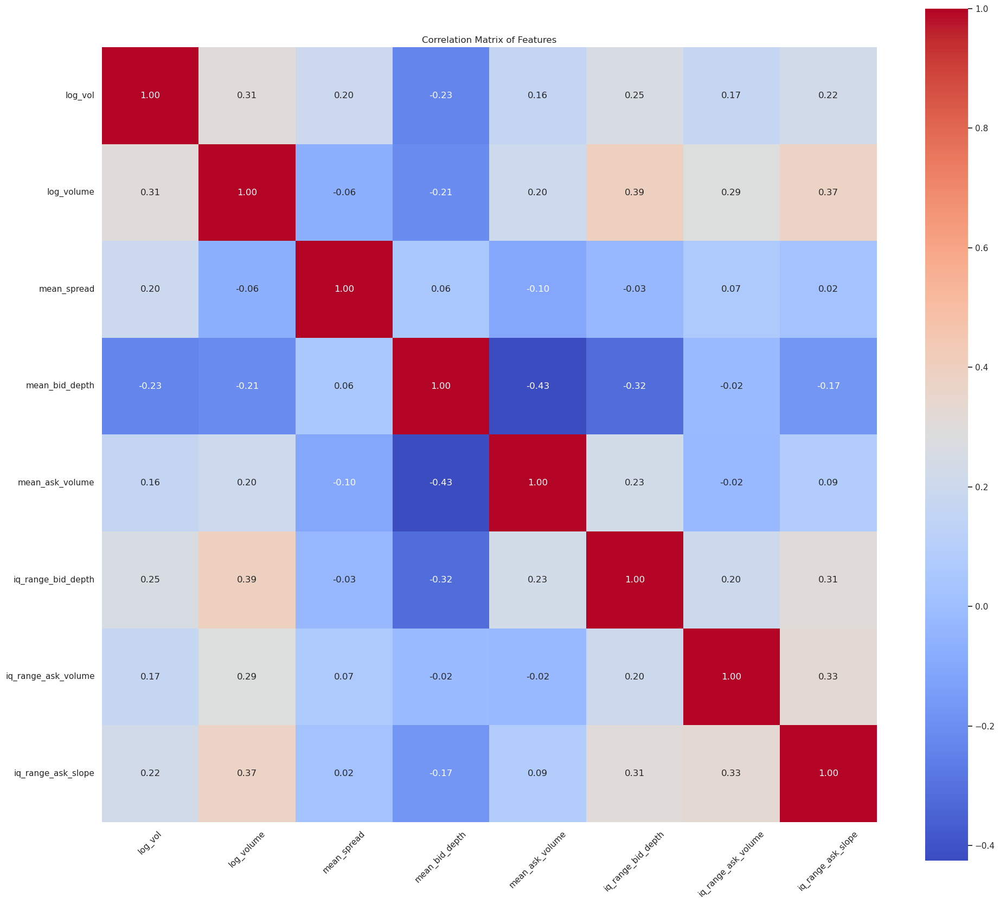

In [13]:
corr = selected_training_data.corr(method='kendall')

 # plot corelation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

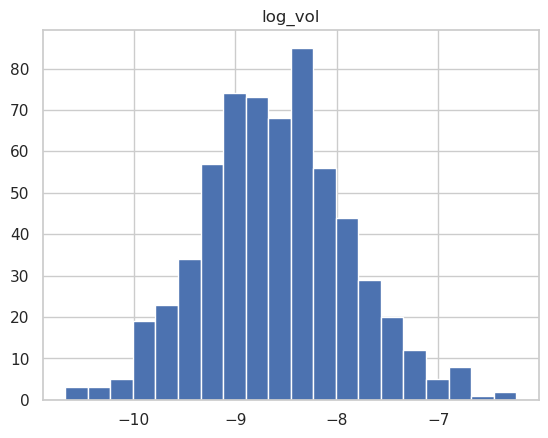

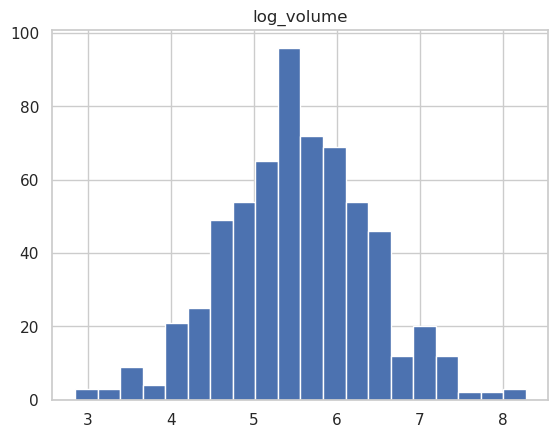

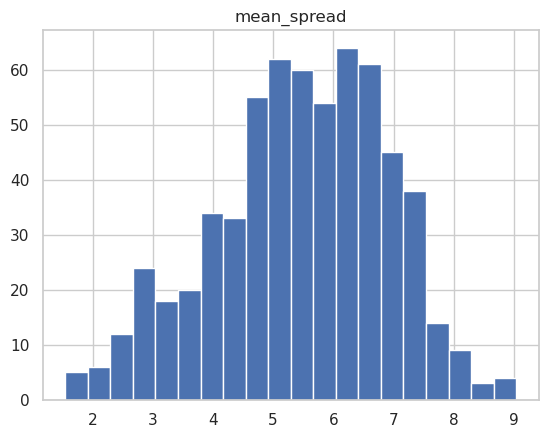

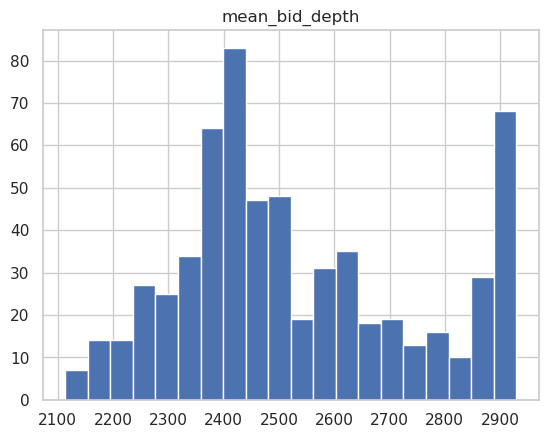

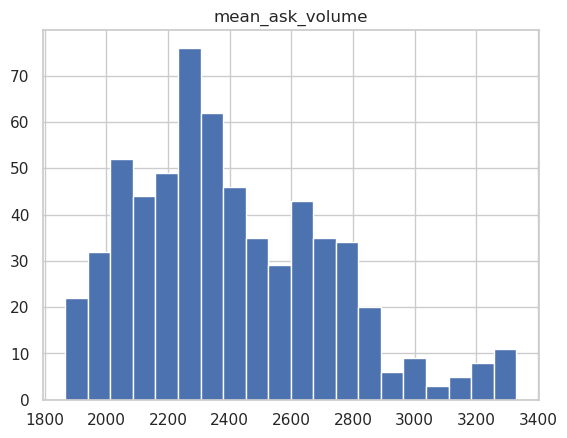

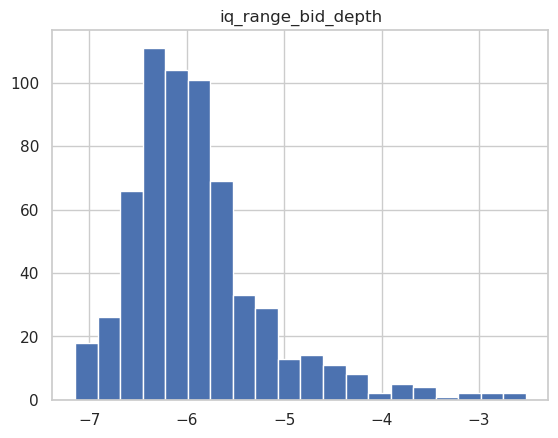

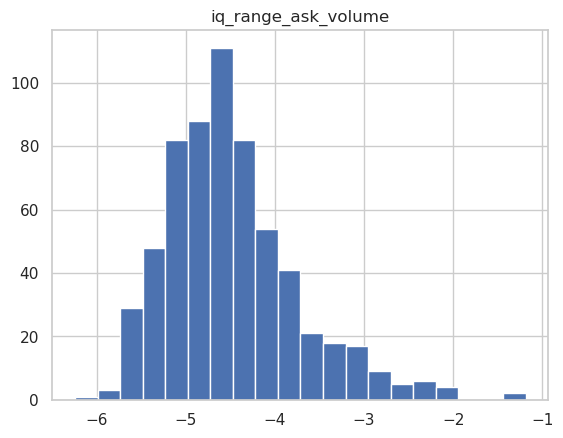

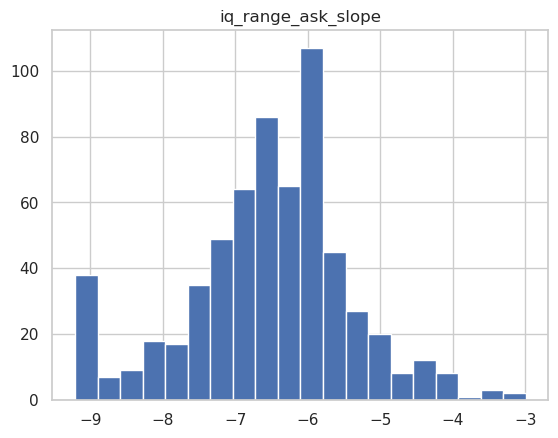

In [50]:
for col in selected_training_data.columns:
    plt.hist(training_data[col], bins=20)
    plt.title(col)
    plt.show()

# Make output templates

In [147]:
full_data = (
    pl.read_csv(data_path / "btc" / "data_df_with_volume.csv")
    .with_columns(pl.col("datetime").str.to_datetime("%Y-%m-%d %H:%M:%S"))
    .sort("datetime")
    ).to_pandas().set_index("datetime")
LAST_TRAINING_DATE = datetime.strptime("2018-06-30 23:59:59", "%Y-%m-%d %H:%M:%S")

In [148]:
test_data = full_data.loc[LAST_TRAINING_DATE:]

In [149]:
test_data

,vol,ret,ret_t-1,ret_t-2,ret_t-3,ret_t-4,ret_t-5,ret_t-6,ret_t-7,ret_t-8,...,ask_depth_t-120,bid_depth_t-120,depth_diff_t-120,ask_volume_t-120,bid_volume_t-120,volume_diff_t-120,weighted_spread_t-120,ask_slope_t-120,bid_slope_t-120,volume
datetime,,,,,,,,,,,,,,,,,,,,,
2018-07-03 23:00:00,0.000285,0.004757,0.000070,0.000310,-0.000913,-0.000027,-0.002540,-0.001752,-0.008606,-0.002550,...,4000.0,2654.0,1346.0,2205.873365,14970.231950,-12764.358585,1282.840225,6525.09,6032.17,877.586113
2018-07-04 00:00:00,0.000241,-0.008128,-0.000990,0.002352,0.001386,-0.000216,0.000018,0.000199,-0.000717,0.001636,...,4000.0,2672.0,1328.0,2181.357432,14990.464470,-12809.107038,1279.774452,6547.43,6070.42,228.097227
2018-07-04 01:00:00,0.000240,0.000449,0.000963,-0.000935,-0.001475,-0.002879,0.001830,-0.002742,0.000978,-0.000227,...,4000.0,2650.0,1350.0,2204.039464,14937.132604,-12733.093141,1270.327015,6510.00,6025.11,365.135193
2018-07-04 02:00:00,0.000173,0.000458,-0.002634,0.000704,-0.000730,-0.001463,0.000829,0.003289,0.000322,0.000285,...,4000.0,2625.0,1375.0,2217.612444,14842.550268,-12624.937823,1282.582009,6493.77,5960.00,328.443579
2018-07-04 03:00:00,0.000177,0.001280,-0.001011,0.001256,-0.000115,0.000712,-0.000528,-0.000147,0.000252,-0.001782,...,4000.0,2624.0,1376.0,2158.504284,14871.097858,-12712.593574,1282.877920,6505.89,5965.24,164.798018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-30 17:00:00,0.000025,-0.000451,-0.000860,0.002857,0.000204,-0.000439,0.000296,0.000723,-0.000709,0.000164,...,4000.0,2841.0,1159.0,2627.367204,11909.731066,-9282.363863,1051.144353,6629.00,6060.00,105.419895
2018-09-30 18:00:00,0.000014,0.000298,0.000607,-0.000619,-0.000017,-0.000020,-0.000150,-0.000742,-0.000193,0.000521,...,4000.0,2840.0,1160.0,2614.198169,11899.085884,-9284.887715,969.486671,6631.00,6060.00,26.923696
2018-09-30 19:00:00,0.000024,-0.002138,-0.000023,-0.000018,0.001304,0.000129,0.000396,-0.000298,-0.000406,0.000384,...,4000.0,2841.0,1159.0,2597.208539,11936.342886,-9339.134347,1066.514037,6628.00,6060.00,49.165087


In [150]:
test_data.index

DatetimeIndex(['2018-07-03 23:00:00', '2018-07-04 00:00:00',
               '2018-07-04 01:00:00', '2018-07-04 02:00:00',
               '2018-07-04 03:00:00', '2018-07-04 04:00:00',
               '2018-07-04 05:00:00', '2018-07-04 06:00:00',
               '2018-07-04 07:00:00', '2018-07-04 08:00:00',
               ...
               '2018-09-30 12:00:00', '2018-09-30 13:00:00',
               '2018-09-30 14:00:00', '2018-09-30 15:00:00',
               '2018-09-30 16:00:00', '2018-09-30 17:00:00',
               '2018-09-30 18:00:00', '2018-09-30 19:00:00',
               '2018-09-30 20:00:00', '2018-09-30 21:00:00'],
              dtype='datetime64[us]', name='datetime', length=1958, freq=None)

In [151]:
output_template = pd.DataFrame(index=test_data.index, columns=["retraining_flag", "model_name"])

In [152]:
output_template.retraining_flag = False

In [153]:
output_template

,retraining_flag,model_name
datetime,,
2018-07-03 23:00:00,False,NaN
2018-07-04 00:00:00,False,NaN
2018-07-04 01:00:00,False,NaN
2018-07-04 02:00:00,False,NaN
2018-07-04 03:00:00,False,NaN
...,...,...
2018-09-30 17:00:00,False,NaN
2018-09-30 18:00:00,False,NaN
2018-09-30 19:00:00,False,NaN


In [154]:
refit_dates = pd.date_range(start=output_template.index[0],
                 end=output_template.index[-1]+ pd.Timedelta(days=5), # to include the last week
                 freq='5D')
refit_dates

DatetimeIndex(['2018-07-03 23:00:00', '2018-07-08 23:00:00',
               '2018-07-13 23:00:00', '2018-07-18 23:00:00',
               '2018-07-23 23:00:00', '2018-07-28 23:00:00',
               '2018-08-02 23:00:00', '2018-08-07 23:00:00',
               '2018-08-12 23:00:00', '2018-08-17 23:00:00',
               '2018-08-22 23:00:00', '2018-08-27 23:00:00',
               '2018-09-01 23:00:00', '2018-09-06 23:00:00',
               '2018-09-11 23:00:00', '2018-09-16 23:00:00',
               '2018-09-21 23:00:00', '2018-09-26 23:00:00',
               '2018-10-01 23:00:00'],
              dtype='datetime64[ns]', freq='5D')

In [155]:
dates = iter(refit_dates)

In [156]:
refit_dates = list(refit_dates)

prev = refit_dates[0] - pd.Timedelta(days=7)
next = refit_dates[0]
prev_writing = refit_dates[0]
for t in output_template.index:
    if prev < t and t >= next:
        prev = next
        next = refit_dates[refit_dates.index(next) + 1]
        output_template.loc[t, "retraining_flag"] = True
        print(f"Size of the window: {pd.Timedelta(t - prev_writing)}")
        prev_writing = t

Size of the window: 0 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 6 days 00:00:00
Size of the window: 4 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 7 days 00:00:00
Size of the window: 3 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00
Size of the window: 5 days 00:00:00


In [157]:
output_template.loc[output_template.loc[:, "retraining_flag"] == True].head(20)

,retraining_flag,model_name
datetime,,
2018-07-03 23:00:00,True,NaN
2018-07-08 23:00:00,True,NaN
2018-07-13 23:00:00,True,NaN
2018-07-18 23:00:00,True,NaN
2018-07-23 23:00:00,True,NaN
2018-07-28 23:00:00,True,NaN
2018-08-03 23:00:00,True,NaN
2018-08-07 23:00:00,True,NaN
2018-08-12 23:00:00,True,NaN


In [158]:
# save the output template
output_template.to_csv(data_path / "btc" / "output_template.csv", index=True)

In [159]:
loaded = pd.read_csv(data_path / "btc" / "output_template.csv", index_col=0)

In [160]:
output_template.index

DatetimeIndex(['2018-07-03 23:00:00', '2018-07-04 00:00:00',
               '2018-07-04 01:00:00', '2018-07-04 02:00:00',
               '2018-07-04 03:00:00', '2018-07-04 04:00:00',
               '2018-07-04 05:00:00', '2018-07-04 06:00:00',
               '2018-07-04 07:00:00', '2018-07-04 08:00:00',
               ...
               '2018-09-30 12:00:00', '2018-09-30 13:00:00',
               '2018-09-30 14:00:00', '2018-09-30 15:00:00',
               '2018-09-30 16:00:00', '2018-09-30 17:00:00',
               '2018-09-30 18:00:00', '2018-09-30 19:00:00',
               '2018-09-30 20:00:00', '2018-09-30 21:00:00'],
              dtype='datetime64[us]', name='datetime', length=1958, freq=None)